In [2]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from scipy.stats import iqr
import sys
import importlib
from itertools import chain
from datetime import date

from uslib import fit_functions as ff
from uslib import load_data as ld

import matplotlib.animation as animation



In [53]:
test = np.loadtxt(r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\16-07\2024-07-17_12-21-10_fb_0.1021µW\PSD_0.1µW.txt", skiprows=13, delimiter=',')

In [64]:
np.loadtxt(r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\16-07\2024-07-17_12-21-10_fb_0.1021µW\CSV0.1UW.csv", skiprows=12, delimiter=',')

array([[-7.    ,  0.244 ],
       [-6.9995,  0.2448],
       [-6.999 ,  0.2448],
       ...,
       [ 6.9985,  0.2436],
       [ 6.999 ,  0.2436],
       [ 6.9995,  0.2436]])

In [66]:
def load_csv_with_header(filename, header_lines_count, delimiter=','):
    header_lines = []
    with open(filename, 'r') as file:
        for _ in range(header_lines_count):
            header_lines.append(file.readline().strip())
        
        data = np.loadtxt(file, delimiter=delimiter)
    
    return header_lines, data

header, data = load_csv_with_header(r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\16-07\2024-07-17_12-21-10_fb_0.1021µW\CSV0.1UW.csv", 12)
print("Header:", header)
print("Data:\n", data)


Header: ['Record Length,Analog:28000', 'Sample Interval,CH:0.0005000000237', 'Vertical Units, CH2:V,,,', 'Vertical Scale, CH2:+1.000000E-02,,,', 'Vertical Offset, CH2:-2.356000E-01,,,', 'Horizontal Units,us,,,', 'Horizontal Scale,1000000.0000000000,,,', 'Model Number,SDS2352X-E,,,', 'Serial Number,SDS2EBAX3R0326,,,', 'Software Version,2.1.1.1.19 R5,,,', 'Source,CH2', 'Second,Volt']
Data:
 [[-7.      0.244 ]
 [-6.9995  0.2448]
 [-6.999   0.2448]
 ...
 [ 6.9985  0.2436]
 [ 6.999   0.2436]
 [ 6.9995  0.2436]]


In [2]:
# data_dir = r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Measurements_2024-03-01"#r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Measurements_2024-02-29"#r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Measurements_2024-02-22"

# data_dir1= r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Measurements_2024-02-29"

# data_dir2 = r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Measurements_2024-02-22"

# data_dir3 = r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Measurements_2024-03-20" #First data entry having separate file for laser measurement

# data_dir4 = r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Measurements_2024-03-21"

# data_dir5 = r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Measurements_2024-03-26"

# data_dir6 = r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_Measurements_2024-05-14"

# data_dir7 =r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_Measurements_2024-05-16"



data_dir=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_1µW_FBMeasurements_2024-05-27"

data_dir1=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_10µW_FBMeasurements_2024-05-27"

data_dir2=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_50µW_FBMeasurements_2024-05-27"

data_dir3=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_100µW_FBMeasurements_2024-05-27"

data_dir4=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_200µW_FBMeasurements_2024-05-27"

data_dir5=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_500µW_FBMeasurements_2024-05-27"

data_dir6=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_750µW_FBMeasurements_2024-05-27"

data_dir7=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_1mW_FBMeasurements_2024-05-27"

data_dir8=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_1.5mW_FBMeasurements_2024-05-27"

data_dir9=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_1µW_FBMeasurements_2024-05-29"

data_dir10=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_1.5µW_FBMeasurements_2024-05-29"

data_dir11=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_2µW_FBMeasurements_2024-05-29"

data_dir12=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_3µW_FBMeasurements_2024-05-29"

data_dir13=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_4µW_FBMeasurements_2024-05-29"

data_dir14=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_6µW_FBMeasurements_2024-05-29"

data_dir15=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_8µW_FBMeasurements_2024-05-29"

data_dir16=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_10µW_FBMeasurements_2024-05-29"

data_dir17=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_16µW_FBMeasurements_2024-05-29"

data_dir18=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_20µW_FBMeasurements_2024-05-29"

data_dir19=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_30µW_FBMeasurements_2024-05-29"

data_dir20=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_32µW_FBMeasurements_2024-05-29"

data_dir21=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_40µW_FBMeasurements_2024-05-29"

data_dir22=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_64µW_FBMeasurements_2024-05-29"

data_dir23=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_128µW_FBMeasurements_2024-05-29"

data_dir24=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_1.5mW_FBMeasurements_2024-05-29"

data_dir25=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_8µW_FBMeasurements_2024-05-31"

data_dir26=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_16µW_FBMeasurements_2024-05-31"

data_dir27=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_30µW_FBMeasurements_2024-05-31"

data_dir28=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_32µW_FBMeasurements_2024-05-31"

data_dir29=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_50µW_FBMeasurements_2024-05-31"


# data_dir30=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_0.0V_1518nmMeasurements_2024-06-05"

# data_dir31=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_0.3V_1518nmMeasurements_2024-06-05"

# data_dir32=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_0.6V_1518nmMeasurements_2024-06-05"

# #data_dir33=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_0.9V_1518nmMeasurements_2024-06-05"

# data_dir33=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_1.2V_1518nmMeasurements_2024-06-05"

# data_dir34=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_1.5V_1518nmMeasurements_2024-06-05"

# data_dir35=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_1.8V_1518nmMeasurements_2024-06-05"

# data_dir36=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_2.1V_1518nmMeasurements_2024-06-05"

# data_dir37=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_2.4V_1518nmMeasurements_2024-06-05"

# data_dir38=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_2.7V_1518nmMeasurements_2024-06-05"

# data_dir39=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_3.0V_1518nmMeasurements_2024-06-05"

# data_dir40=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_3.1V_1518nmMeasurements_2024-06-05"

# data_dir41=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_3.2V_1518nmMeasurements_2024-06-05"

# data_dir42=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_3.3V_1518nmMeasurements_2024-06-05"

# data_dir43=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_3.4V_1518nmMeasurements_2024-06-05"

# data_dir44=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_3.4V_1518nmMeasurements_2024-06-05"

# data_dir45=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_3.5V_1518nmMeasurements_2024-06-05"

# data_dir46=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_3.6V_1518nmMeasurements_2024-06-05"

# data_dir47=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_3.7V_1518nmMeasurements_2024-06-05"

# data_dir48=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_3.8V_1518nmMeasurements_2024-06-05"

# data_dir49=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_3.9V_1518nmMeasurements_2024-06-05"

# data_dir50=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_4.0V_1518nmMeasurements_2024-06-05"

# data_dir51=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_4.1V_1518nmMeasurements_2024-06-05"

# data_dir52=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_4.2V_1518nmMeasurements_2024-06-05"

# data_dir53=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_4.3V_1518nmMeasurements_2024-06-05"

# data_dir54=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_4.4V_1518nmMeasurements_2024-06-05"

# data_dir55=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_4.5V_1518nmMeasurements_2024-06-05"

# data_dir56=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_4.6V_1518nmMeasurements_2024-06-05"

# data_dir57=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_4.7V_1518nmMeasurements_2024-06-05"

# data_dir58=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_4.8V_1518nmMeasurements_2024-06-05"

# data_dir59=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_4.9V_1518nmMeasurements_2024-06-05"

# data_dir60=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_5.0V_1518nmMeasurements_2024-06-05"


data_dirs = [data_dir,data_dir1,data_dir2, data_dir3, data_dir4, data_dir5, data_dir6, data_dir7, data_dir8, data_dir9, data_dir10, data_dir11, data_dir12, data_dir13, data_dir14, data_dir15, data_dir16, data_dir17, data_dir18, data_dir19, data_dir20, data_dir21, data_dir22, data_dir23, data_dir24, data_dir25, data_dir26, data_dir27, data_dir28, data_dir29]# data_dir30, data_dir31, data_dir32, data_dir33, data_dir34, data_dir35, data_dir36, data_dir37, data_dir38, data_dir39, data_dir40, data_dir41, data_dir42, data_dir43, data_dir44, data_dir45, data_dir46, data_dir47, data_dir48, data_dir49, data_dir50, data_dir51, data_dir52, data_dir53, data_dir54, data_dir55, data_dir56, data_dir57, data_dir58, data_dir59,data_dir60]

datasets_no = len(data_dirs)# len(data_dirs)

dirs= [None for _ in range(datasets_no)]

#path_coherent = r"C:\Users\au622616\OneDrive - Aarhus universitet\U shaped measurements\ESA_spectrum_Feedback measurement.txt"

In [3]:
for i in range(datasets_no):

    dirs[i] = ld.get_lab_session_data(data_dirs[i])

#ld.get_all_data()

In [4]:
measurements = [[[]for _ in range(len(dirs[i][1]))] for i in range(datasets_no)]

laser_powers = [[None for _ in range(len(dirs[i][1]))] for i in range(datasets_no)]
laser_lists = [[[]for _ in range(len(dirs[i][1]))] for i in range(datasets_no)]
las_var = [[None for _ in range(len(dirs[i][1]))] for i in range(datasets_no)]

feedback_powers = [[None for _ in range(len(dirs[i][1]))] for i in range(datasets_no)]
fb_var = [[None for _ in range(len(dirs[i][1]))] for i in range(datasets_no)]
feedback_lists = [[[]for _ in range(len(dirs[i][1]))] for i in range(datasets_no)]



list_of_dicts = [[{} for _ in range(len(dirs[i][1]))] for i in range(datasets_no)]


start_times =[[None for _ in range(len(dirs[i][1]))] for i in range(datasets_no)]


for data_index in range(datasets_no):
    #fig, ax = plt.subplots()
    #artists = []

    #if data_index < 3:
    for i, directory in enumerate(dirs[data_index][1]): #Close spectrum is index 1
        
        if directory == None:
            pass
        else:
            fs = directory.freqs #Obtaining ESA close spectrum frequencies
            ps = directory.powers #Obtaining ESA close spectrum powers

            plot = False
        
            #fs, ps = dp.get_close_spectrum_from_folder(directory,plot=plot,center_about_carrier=True)

            measurements[data_index][i] = fs, ps

            list_of_dicts[data_index][i] = directory.params



            try:
                if dirs[data_index][3].las_avg[i] != None: #If there is a separate laser file

                    laser_powers[data_index][i] = dirs[data_index][3].las_avg[i]
                    las_var[data_index][i] = dirs[data_index][3].las_var[i]
                    laser_lists[data_index][i] =  dirs[data_index][3].laser_powers[i]


                else:
                
                    laser_powers[data_index][i] = list_of_dicts[data_index][i]['Laser power']
                    las_var[data_index][i] = None
            except AttributeError:
                
                pow_time_dict = dirs[data_index][3][i]

                laser_lists[data_index][i] = pow_time_dict['laser_power']

                laser_powers[data_index][i] = np.average(pow_time_dict['laser_power'])

                las_var[data_index][i] = np.var(pow_time_dict['laser_power'])


            try:    
                if dirs[data_index][3].fb_avg[i] != None: #If there is a separate laser file

                    feedback_powers[data_index][i] = dirs[data_index][3].fb_avg[i] #Saves the average power pr measurement
                    fb_var[data_index][i] = dirs[data_index][3].fb_var[i]
                    feedback_lists[data_index][i] =  dirs[data_index][3].fb_powers[i]


                else:

                    feedback_powers[data_index][i] = list_of_dicts[data_index][i]['Feedback power']
                    fb_var[data_index][i] = None
            except AttributeError:
                
                pow_time_dict = dirs[data_index][3][i]

                feedback_lists[data_index][i] = pow_time_dict['feedback_power']

                feedback_powers[data_index][i] = np.average(pow_time_dict['feedback_power'])

                fb_var[data_index][i] = np.var(pow_time_dict['feedback_power'])

            
            if plot:
                    
                plt.figure()
                plt.plot(fs,ps)
                plt.xlim([-0.6,0.6])
                plt.ylim([-120,-40])
                plt.xlabel('Frequency detuning [MHz]')
                plt.ylabel('Spectrum power [dBc]')
                plt.title(f'Plot number {i}')

            try:
                start_times[data_index][i] = dirs[data_index][3][i]['start_time']

            except:
                pass


feedback_ratios = [[None for _ in range(len(dirs[i][1]))] for i in range(datasets_no)]

for data_index in range(datasets_no):

    max_laser_power = max([value for value in laser_powers[data_index] if value is not None])

    for i in range(len(dirs[data_index][1])):
            
            laser_power = laser_powers[data_index][i]
            feedback_power = feedback_powers[data_index][i]

            if laser_power is not None:

                feedback_ratios[data_index][i] = ld.feedback_ratio(laser_power,feedback_power,max_laser_power)


In [5]:
no_of_pow_reads = [0 for _ in range(3,datasets_no)]

for data_index in range(3,datasets_no):
    for liste in laser_lists[data_index]:
        no_of_pow_reads[data_index-3] += len(liste)

    no_of_pow_reads[data_index-3] /= len(laser_lists[data_index])
    

In [6]:
'''with open(ld.get_all_data(data_dirs[3])[0]) as laser_file:

    laser_variances = laser_file.readlines()

    for i,directory in enumerate(dirs[data_index]):    
        las_avg = np.average(eval(laser_variances[i+1]))
        laser_powers[data_index][i] = las_avg     
        #feedback_powers[data_index][i] = list_of_dicts[data_index][i]['Feedback power']  '''

"with open(ld.get_all_data(data_dirs[3])[0]) as laser_file:\n\n    laser_variances = laser_file.readlines()\n\n    for i,directory in enumerate(dirs[data_index]):    \n        las_avg = np.average(eval(laser_variances[i+1]))\n        laser_powers[data_index][i] = las_avg     \n        #feedback_powers[data_index][i] = list_of_dicts[data_index][i]['Feedback power']  "

In [7]:
if True:
    pass
else: 
    # range_of_incoherent =  [list(range(0,1)) + list(range(10,11)) + list(range(12,13))]# + list(range(63,66))
    # range_of_incoherent.append(list(range(0,5)) + list(range(7,8))+ list(range(40,42)) + list(range(63,67)))
    # range_of_incoherent.append(list(range(0,20))+ list(range(36,38)) + list(range(41,43)))
    # range_of_incoherent.append(list(range(24)) + list(range(25,26)) + list(range(32,33)) + list(range(35,36)) + list(range(37,66)) + list(range(88,90)) + list(range(94,95)) + list(range(96,97)) + list(range(98,99)))
    # range_of_incoherent.append(list(range(13)) + list(range(19,34)) + list(range(43,49)))
    # range_of_incoherent.append( list(range(9)) + list(range(18,34)) )
    # range_of_incoherent.append( list(range(9)) + list(range(9,102)) )
    # range_of_incoherent.append( list(range(9)) + list(range(9,102)) )

    linewidths =[[None for _ in range(len(dirs[i][1]))] for i in range(datasets_no)]
    #linewidth_lor = [[] for _ in range(3)]


    for data_index in range(datasets_no):
        #for number, i in enumerate(range_of_incoherent[data_index]):

        for i in range(len(dirs[data_index][1])):
                
                if dirs[data_index][1][i] ==None:
                    pass
                else:
                    fs = measurements[data_index][i][0]
                    ps = measurements[data_index][i][1] - max(measurements[data_index][i][1])
                    #fs, ps = dp.get_close_spectrum_from_folder(dirs[i],plot=False,center_about_carrier=True)



                    filter_close = abs(fs) < 0.075
                    filter_far = (abs(fs) > 0.3) & (abs(fs) < 0.6)

                    
                    params_gauss, whatevs = curve_fit(ff.gauss_log,fs[filter_close]*10**6,ps[filter_close])

                    #params_lor, whatevs = curve_fit(ff.lor_log,fs[filter_far]*10**6,ps[filter_far])




                    #feedback_ratio = feedback_ratio_EOM_on(dirs[i])
                    laser_power = laser_powers[data_index][i]
                    feedback_power = feedback_powers[data_index][i]

                    feedback_ratio = feedback_ratios[data_index][i]
                    
                    linewidths[data_index][i] = (abs(params_gauss[0])*2*np.sqrt(2*np.log(2))*np.sqrt(10/np.log(10))/np.sqrt(2)) #Divided by sqrt(2) to get linewidth from FWHM
                    #linewidth_lor.append(abs(params_lor[1])) #Divided by two to get linewidth from FWHM


                    #linewidths.append(params[0])

                    filter_gauss_plot = abs(fs) < 0.6

                    plt.figure()
                    plt.plot(fs,ps, label = 'Data, background subtracted')
                    plt.plot(fs[filter_gauss_plot],ff.gauss_log(fs[filter_gauss_plot]*10**6,params_gauss[0],params_gauss[1]),label='gauss function')
                    #plt.plot(fs,ff.lor_log(fs*10**6,params_lor[0],params_lor[1]),label='Lorentzian function')
                    plt.title(f'index {data_index} no. {i}, feedback: {feedback_ratio:.2f} dB')



                    #plt.title(f'Linewidth: {params[0]*1e-3:.1f} kHz, feedback ratio: {feedback_ratio} dB, Laser power: {laser_power*1e6:.1f} µW')
                    plt.legend()

                    plt.xlim([-0.6,.6])
                    plt.ylim([-80,0])


In [8]:
# range_of_zeta = [list(range(1,10)) + list(range(11,12)) + list(range(13,29))] # + list(range(66,69))
# range_of_zeta.append(list(range(5,7)) + list(range(8,40)) + list(range(42,63)) + list(range(67,70))) # + list(range(66,69))
# range_of_zeta.append(list(range(20,36)) + list(range(38,41)))
# range_of_zeta.append(list(range(24,25)) + list(range(26,32)) + list(range(33,35)) + list(range(36,37)) + list(range(66,88)) + list(range(90,94)) + list(range(95,96)) + list(range(97,98)) + list(range(99,102)))
# range_of_zeta.append(list(range(13,19)) + list(range(34,43)) + list(range(49,52)))
# range_of_zeta.append( list(range(9,18)) + list(range(34,52)) )
# range_of_zeta.append( list(range(72)) + list(range(73,102)) )
# range_of_zeta.append( list(range(9))) 


#list_of_dicts_zeta = [[{} for _ in range(len(range_of_zeta[i]))] for i in range(3)]
#linewidth_zeta= [[] for _ in range(3)]
#feedback_ratios_zeta = [[] for _ in range(3)]
#laser_powers_zeta = [[] for _ in range(3)]
#feedback_powers_zeta = [[] for _ in range(3)]

linewidths =[[None for _ in range(len(dirs[i][1]))] for i in range(datasets_no)]

#Saving the plots with the lowest linewidths


def get_smsr(fs, ps, center, fsr, plot = False):
    sideband1 = center - fsr
    sideband2 = center + fsr

    filter1 = abs(fs - sideband1) < 1
    ps1 = ps[filter1]
    fs1 = fs[filter1]

    filter2 = abs(fs - sideband2) < 1
    ps2 = ps[filter2]
    fs2 = fs[filter2]

    filter3 = abs(fs - center) < 1
    ps3 = ps[filter3]
    fs3 = fs[filter3]

    if plot:
        plt.plot(fs,ps)
    return max(ps3) - max([max(ps1),max(ps2)])


smsrs =[[None for _ in range(len(dirs[i][0]))] for i in range(datasets_no)]



for data_index in range(datasets_no):
    #for number, i in enumerate(range_of_zeta[data_index]):
    
    for i in range(len(dirs[data_index][1])):
            
        if dirs[data_index][1][i] ==None:
            pass
        else:
            
            #fs, ps = dp.get_close_spectrum_from_folder(dirs[i],plot=False,center_about_carrier=True)

            fs = measurements[data_index][i][0]
            ps = measurements[data_index][i][1] - max(measurements[data_index][i][1])

            if data_index == 0 or data_index ==9:
                filter = (abs(fs) > 0.2) & (abs(fs) < 0.7)
            else:
                filter = (abs(fs) > 0.2) & (abs(fs) < 0.4)


            # try:
            params, whatevs = curve_fit(ff.zeta_fit,fs[filter]*10**6,ps[filter],p0=[3*10**3,25,3140],bounds=((1e2,-100,2800),(35e3,100,3400)))



            linewidths[data_index][i] = params[0]
            #linewidth_lor.append(params[0])

            # except RuntimeError:
                # linewidths[data_index][i] = None         


            laser_power = laser_powers[data_index][i]
            feedback_power = feedback_powers[data_index][i]

            feedback_ratio = feedback_ratios[data_index][i]

            filter_zeta_plot = abs(fs) < 0.6

            fs_full = dirs[data_index][0][i].freqs 
            ps_full = dirs[data_index][0][i].powers

            smsrs[data_index][i] = get_smsr(fs_full,ps_full,80,12.5)




            # plt.figure()
            # plt.plot(fs,ps, label = 'Data, background subtracted')
            # plt.plot(fs[filter_zeta_plot],ff.zeta_fit(fs[filter_zeta_plot]*10**6,params[0],params[1],params[2]), label = 'zeta function')
            # plt.title(f'{data_dirs[data_index][105:-23]}, {data_dirs[data_index][-10:]}  no. {i}, Linewidth: {params[0]*1e-3:.1f} kHz, feedback ratio: {feedback_ratio:.2f} dB, Laser power: {laser_power*1e6:.1f} µW')
            # plt.legend()

            # plt.xlim([-0.8,0.8])
            # plt.ylim([-100,0])


In [9]:
os.chdir(r'C:\Users\au617810\OneDrive - Aarhus universitet\Videnskabelig assistent')

Linewidth: 16788.268510570648, offset: 37.39667491106798, delay length: 3159.7628632975952
Linewidth: 6279.905326828522, offset: 32.47606913451508, delay length: 3140.362437610111
Linewidth: 913.8171137337557, offset: 21.403698681011743, delay length: 3136.1953682144626
Linewidth: 318.5304620756276, offset: 24.829537748621878, delay length: 3136.044823701356


c:\Users\au617810\.conda\envs\conda_env\Lib\site-packages\uslib\fit_functions.py:81: RuntimeWarning: invalid value encountered in log10
  return 10*np.log10(zeta_func(freq,linewidth,time_delay(length)))+offset


Linewidth: 412.01544327456855, offset: 19.163727666224087, delay length: 3136.0256163837544
Linewidth: 404.835606724325, offset: 19.087055829238807, delay length: 3135.84206631592
Linewidth: 283.6002064848197, offset: 20.632872631540703, delay length: 3135.5707870683823


C:\Users\au617810\AppData\Local\Temp\ipykernel_17660\2676037160.py:100: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


Linewidth: 341.4386992789833, offset: 21.29820103683811, delay length: 3135.4547264015782
Linewidth: 225.60637845693003, offset: 26.82156774497656, delay length: 3134.153975634828
Linewidth: 16258.76920322275, offset: 38.28038249935584, delay length: 3158.403485429462
Linewidth: 13296.555971309444, offset: 38.20769149272577, delay length: 3148.939503200091
Linewidth: 10458.561137006012, offset: 36.793007747610815, delay length: 3136.404425109744
Linewidth: 6922.829784989691, offset: 34.801418045943144, delay length: 3136.8396248073664
Linewidth: 5641.444865498926, offset: 34.016368959347815, delay length: 3140.219247484757
Linewidth: 2544.155514855845, offset: 30.99184400805797, delay length: 3135.436959053213
Linewidth: 3716.6523787816136, offset: 31.052498864987342, delay length: 3138.36571288976
Linewidth: 1682.9850759559615, offset: 29.117298733500697, delay length: 3137.4372956918946
Linewidth: 2510.6510463753075, offset: 31.838131061352666, delay length: 3139.2249413589925
Linewi

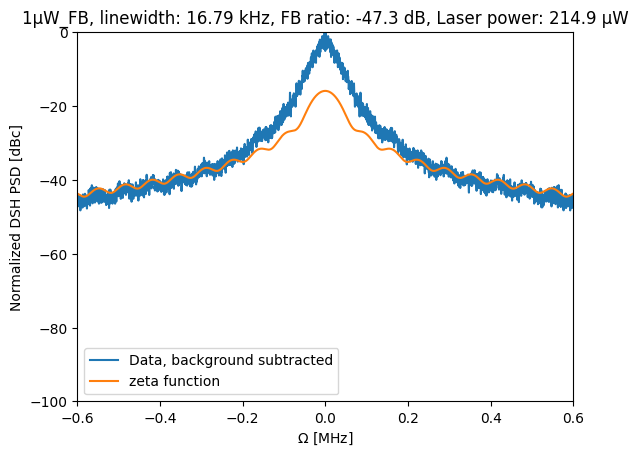

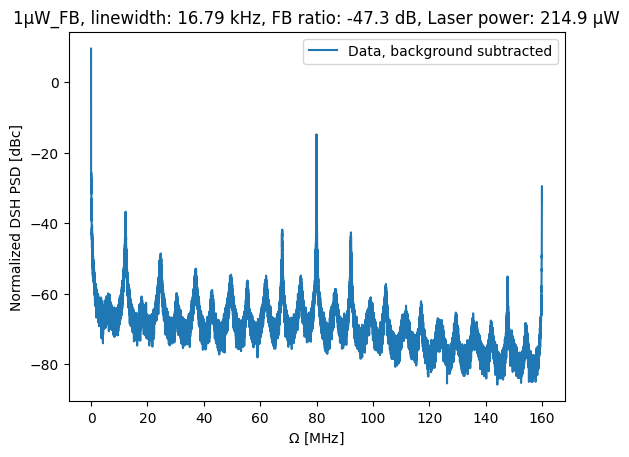

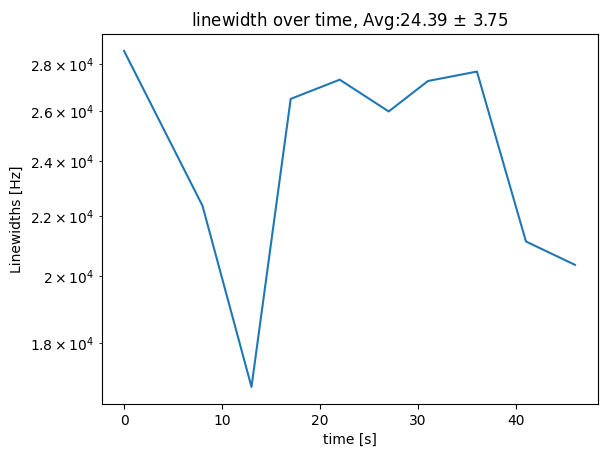

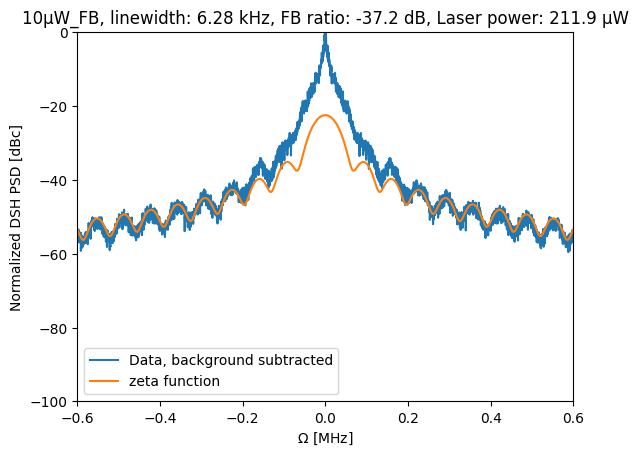

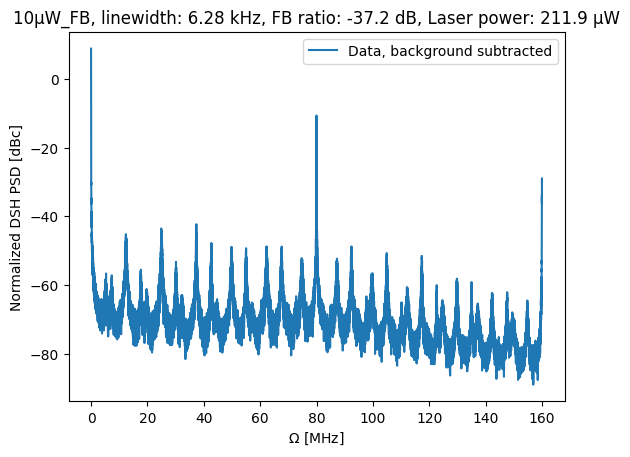

...

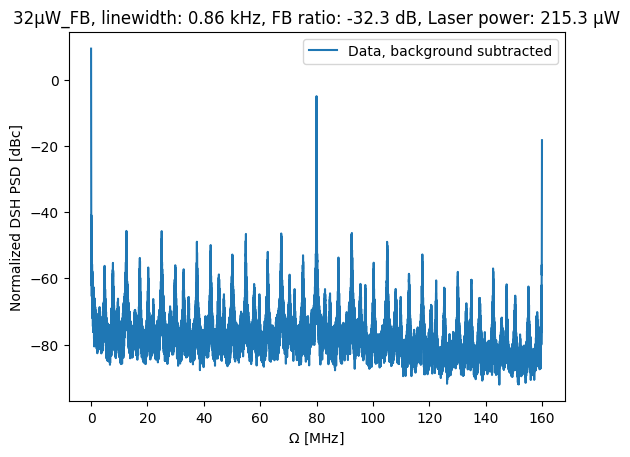

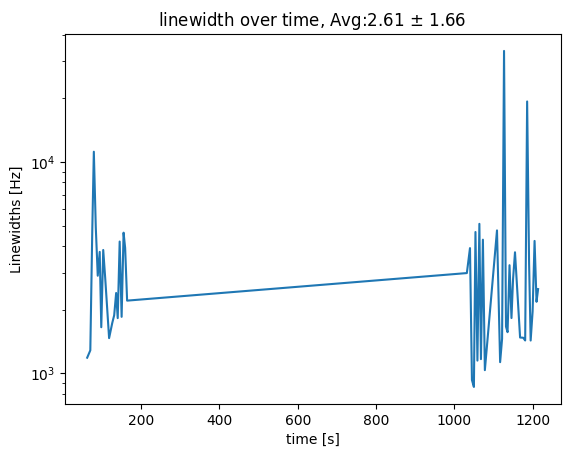

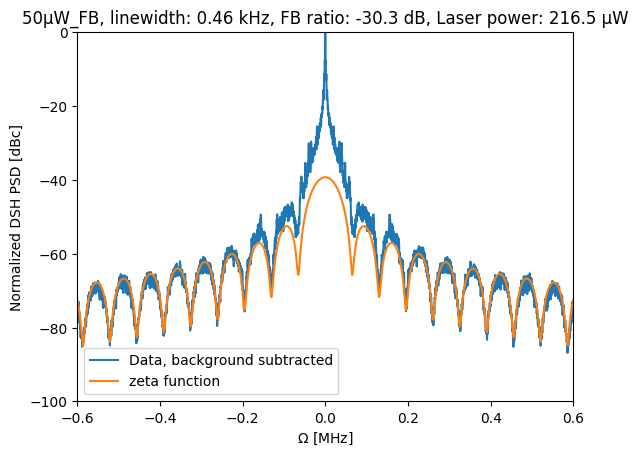

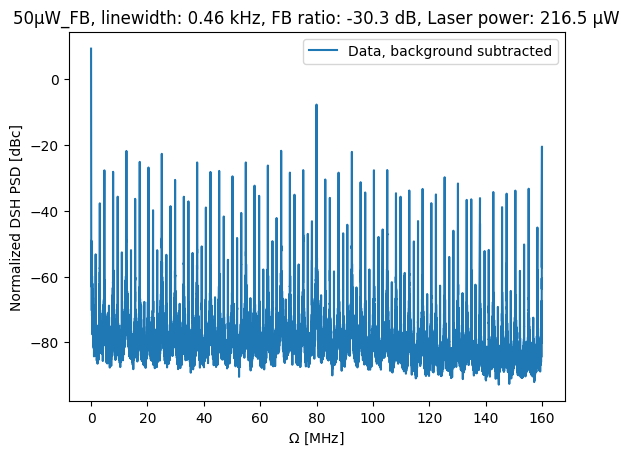

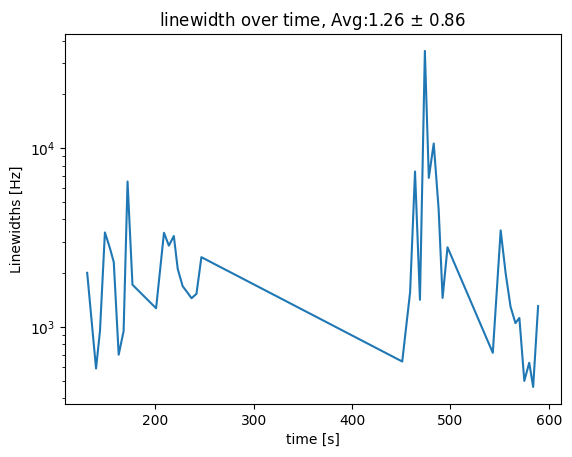

In [10]:


best_linewidths = [[None for _ in range(datasets_no)] for _ in range(6)]

list_around_best_linewidths = [[] for _ in range(datasets_no)] # In order to take the linewidths from the same batch of 10


for data_index in range(datasets_no):

    lowest_linewidth = min([v for v in linewidths[data_index] if v != None])

    i = linewidths[data_index].index(lowest_linewidth)

    fs = measurements[data_index][i][0]
    ps = measurements[data_index][i][1] - max(measurements[data_index][i][1])
    

    filter = (abs(fs) > 0.2) & (abs(fs) < 0.4)

    params, whatevs = curve_fit(ff.zeta_fit,fs[filter]*10**6,ps[filter],p0=[3*10**3,25,3140])

    print(f'Linewidth: {params[0]}, offset: {params[1]}, delay length: {params[2]}')


    linewidths[data_index][i] = params[0]
    #linewidth_lor.append(params[0])


    laser_power = laser_powers[data_index][i]
    feedback_power = feedback_powers[data_index][i]

    feedback_ratio = feedback_ratios[data_index][i]

    best_linewidths[0][data_index] = feedback_ratio
    best_linewidths[1][data_index] = lowest_linewidth
    best_linewidths[2][data_index] = i

    list_around_best_linewidths[data_index] = [v for v in linewidths[data_index][i - i%10 : i - i%10 + 10] if v != None] 

    best_linewidths[3][data_index] = np.average(list_around_best_linewidths[data_index]) #np.average(linewidths[data_index][i - i%10 : i - i%10 + 10]) #Average of block of 10 that the best linewidth has been measured in
    best_linewidths[4][data_index] = np.std(list_around_best_linewidths[data_index]) # 10 : i - i%10 + 10]) #Standard deviation around average in the block of 10 that the best linewidth has been measured in



    plt.figure()
    plt.plot(fs,ps, label = 'Data, background subtracted')
    plt.plot(fs,ff.zeta_fit(fs*10**6,params[0],params[1],params[2]), label = 'zeta function')
    plt.title(fr'{data_dirs[data_index][105:-23]}, linewidth: {params[0]*1e-3:.2f} kHz, FB ratio: {feedback_ratio:.1f} dB, Laser power: {laser_power*1e6:.1f} µW')
    plt.legend()

    plt.xlim([-.6,.6])
    plt.ylim([-100,0])

    plt.xlabel(r'$\Omega$ [MHz]')
    plt.ylabel(r'Normalized DSH PSD [dBc]')

    try:
        if data_index == 0:
            os.mkdir(fr'.\Measurement spectra and plots\Linewidths\Analyzed_{date.today()}_1518nm')
    except:
        pass 
    
    # plt.savefig(fr'.\Measurement spectra and plots\Linewidths\Analyzed_{date.today()}_1518nm\{data_dirs[data_index][96:]}_ESA_spectrum_zeta_fit_low_linewidth_best.pdf')
    # plt.savefig(fr'.\Measurement spectra and plots\Linewidths\Analyzed_{date.today()}_1518nm{data_dirs[data_index][96:]}_ESA_spectrum_zeta_fit_low_linewidth_best.png')



    fs_full = dirs[data_index][0][i].freqs 
    ps_full = dirs[data_index][0][i].powers

    smsr1 = 0
    if i > 0:
        if dirs[data_index][0][i-1] != None: 
            fs_full1 = dirs[data_index][0][i-1].freqs 
            ps_full1 = dirs[data_index][0][i-1].powers
            smsr1 = get_smsr(fs_full1,ps_full1,80,12.5)

    smsr = get_smsr(fs_full,ps_full,80,12.5)


    best_linewidths[5][data_index] = max([smsr, smsr1])

    plt.figure()
    plt.plot(fs_full,ps_full, label = 'Data, background subtracted')
    #plt.plot(fs_full,ff.zeta_fit(fs*10**6,params[0],params[1],params[2]), label = 'zeta function')
    plt.title(fr'{data_dirs[data_index][105:-23]}, linewidth: {params[0]*1e-3:.2f} kHz, FB ratio: {feedback_ratio:.1f} dB, Laser power: {laser_power*1e6:.1f} µW')
    plt.legend()

    #plt.xlim([-.6,.6])
    #plt.ylim([-80,0])

    plt.xlabel(r'$\Omega$ [MHz]')
    plt.ylabel(r'Normalized DSH PSD [dBc]')


    # plt.savefig(fr'.\Measurement spectra and plots\Linewidths\Analyzed_{date.today()}_1518nm\{data_dirs[data_index][96:]}_ESA_full_spectrum_low_linewidth_best.pdf')
    # plt.savefig(fr'.\Measurement spectra and plots\Linewidths\Analyzed_{date.today()}_1518nm\{data_dirs[data_index][96:]}_ESA_full_spectrum_low_linewidth_best.png')




    plt.figure()
    plt.plot(start_times[data_index],linewidths[data_index])
    
    if len(list_around_best_linewidths[data_index]) < 10:
        plt.title(fr'linewidth over time, Avg:{best_linewidths[3][data_index]*1e-3:.2f} $\pm$ {best_linewidths[4][data_index]*1e-3:.2f}, *{len(list_around_best_linewidths[data_index])} in avg, std')
    else:
        plt.title(fr'linewidth over time, Avg:{best_linewidths[3][data_index]*1e-3:.2f} $\pm$ {best_linewidths[4][data_index]*1e-3:.2f}')

    plt.xlabel('time [s]')
    plt.ylabel('Linewidths [Hz]')
    plt.yscale('log')
    # plt.savefig(fr'.\Measurement spectra and plots\Linewidths\Analyzed_{date.today()}_1518nm\{data_dirs[data_index][96:]}_linewidths_vs_time.pdf')
    # plt.savefig(fr'.\Measurement spectra and plots\Linewidths\Analyzed_{date.today()}_1518nm\{data_dirs[data_index][96:]}_linewidths_vs_time.png')

In [11]:
data_dir_1km=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_0.25µW_FB_1kmMeasurements_2024-05-30"

data_dir_1km1=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_0.5µW_FB_1kmMeasurements_2024-05-30"

data_dir_1km2=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_1µW_FB_1kmMeasurements_2024-05-30"

data_dir_1km3=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_1.5µW_FB_1kmMeasurements_2024-05-30"

data_dir_1km4=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_2µW_FB_1kmMeasurements_2024-05-30"

data_dir_1km5=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_3µW_FB_1kmMeasurements_2024-05-30"

data_dir_1km6=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_4µW_FB_1kmMeasurements_2024-05-30"

data_dir_1km7=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_6µW_FB_1kmMeasurements_2024-05-30"

data_dir_1km8=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_8µW_FB_1kmMeasurements_2024-05-30"

data_dir_1km9=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_10µW_FB_1kmMeasurements_2024-05-30"

data_dir_1km10=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_15µW_FB_1kmMeasurements_2024-05-30"

data_dir_1km11=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_20µW_FB_1kmMeasurements_2024-05-30"

data_dir_1km12=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_30µW_FB_1kmMeasurements_2024-05-30"

data_dir_1km13=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_40µW_FB_1kmMeasurements_2024-05-30"

data_dir_1km14=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_50µW_FB_1kmMeasurements_2024-05-30"

data_dir_1km15=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_100µW_FB_1kmMeasurements_2024-05-30"

data_dir_1km16=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_1.5mW_FB_1kmMeasurements_2024-05-30"


data_dirs_1km = [data_dir_1km,data_dir_1km1,data_dir_1km2, data_dir_1km3, data_dir_1km4, data_dir_1km5, data_dir_1km6, data_dir_1km7, data_dir_1km8, data_dir_1km9, data_dir_1km10, data_dir_1km11, data_dir_1km12, data_dir_1km13, data_dir_1km14, data_dir_1km15, data_dir_1km16]
datasets_no_1km = len(data_dirs_1km)# len(data_dir_1kms)

#path_coherent = r"C:\Users\au622616\OneDrive - Aarhus universitet\U shaped measurements\ESA_spectrum_Feedback measurement.txt"
dirs_1km= []

for i in range(datasets_no_1km):

    dirs_1km.append(ld.get_lab_session_data(data_dirs_1km[i]))

#ld.get_all_data()



In [12]:
measurements_1km = [[[]for _ in range(len(dirs_1km[i][1]))] for i in range(datasets_no_1km)]

laser_powers_1km = [[None for _ in range(len(dirs_1km[i][1]))] for i in range(datasets_no_1km)]
laser_lists_1km = [[[]for _ in range(len(dirs_1km[i][1]))] for i in range(datasets_no_1km)]
las_var_1km = [[None for _ in range(len(dirs_1km[i][1]))] for i in range(datasets_no_1km)]

feedback_powers_1km = [[None for _ in range(len(dirs_1km[i][1]))] for i in range(datasets_no_1km)]
fb_var_1km = [[None for _ in range(len(dirs_1km[i][1]))] for i in range(datasets_no_1km)]
feedback_lists_1km = [[[]for _ in range(len(dirs_1km[i][1]))] for i in range(datasets_no_1km)]

start_times_1km =[[None for _ in range(len(dirs_1km[i][1]))] for i in range(datasets_no_1km)]

list_of_dicts_1km = [[{} for _ in range(len(dirs_1km[i][1]))] for i in range(datasets_no_1km)]




for data_index in range(datasets_no_1km):
    #fig, ax = plt.subplots()
    #artists = []

    #if data_index < 3:
    for i, directory in enumerate(dirs_1km[data_index][1]): #Close spectrum is index 1
        
        if directory == None:
            pass
        else:
            fs = directory.freqs #Obtaining ESA close spectrum frequencies
            ps = directory.powers #Obtaining ESA close spectrum powers

            plot = False
        
            #fs, ps = dp.get_close_spectrum_from_folder(directory,plot=plot,center_about_carrier=True)

            measurements_1km[data_index][i] = fs, ps

            list_of_dicts_1km[data_index][i] = directory.params



            try:
                if dirs_1km[data_index][3].las_avg[i] != None: #If there is a separate laser file

                    laser_powers_1km[data_index][i] = dirs_1km[data_index][3].las_avg[i]
                    las_var_1km[data_index][i] = dirs_1km[data_index][3].las_var[i]
                    laser_lists_1km[data_index][i] =  dirs_1km[data_index][3].laser_powers[i]


                else:
                
                    laser_powers_1km[data_index][i] = list_of_dicts_1km[data_index][i]['Laser power']
                    las_var_1km[data_index][i] = None
            except AttributeError:
                
                pow_time_dict = dirs_1km[data_index][3][i]

                laser_lists_1km[data_index][i] = pow_time_dict['laser_power']

                laser_powers_1km[data_index][i] = np.average(pow_time_dict['laser_power'])

                las_var_1km[data_index][i] = np.var(pow_time_dict['laser_power'])


            try:    
                if dirs_1km[data_index][3].fb_avg[i] != None: #If there is a separate laser file

                    feedback_powers_1km[data_index][i] = dirs_1km[data_index][3].fb_avg[i] #Saves the average power pr measurement
                    fb_var_1km[data_index][i] = dirs_1km[data_index][3].fb_var[i]
                    feedback_lists_1km[data_index][i] =  dirs_1km[data_index][3].fb_powers[i]


                else:

                    feedback_powers_1km[data_index][i] = list_of_dicts_1km[data_index][i]['Feedback power']
                    fb_var_1km[data_index][i] = None
            except AttributeError:
                
                pow_time_dict = dirs_1km[data_index][3][i]

                feedback_lists_1km[data_index][i] = pow_time_dict['feedback_power']

                feedback_powers_1km[data_index][i] = np.average(pow_time_dict['feedback_power'])

                fb_var_1km[data_index][i] = np.var(pow_time_dict['feedback_power'])

            
            if plot:
                    
                plt.figure()
                plt.plot(fs,ps)
                plt.xlim([-0.6,0.6])
                plt.ylim([-120,-40])
                plt.xlabel('Frequency detuning [MHz]')
                plt.ylabel('Spectrum power [dBc]')
                plt.title(f'Plot number {i}')

            try:
                start_times_1km[data_index][i] = dirs_1km[data_index][3][i]['start_time']
            except:
                pass


feedback_ratios_1km = [[None for _ in range(len(dirs_1km[i][1]))] for i in range(datasets_no_1km)]

for data_index in range(datasets_no_1km):

    max_laser_power = max([value for value in laser_powers_1km[data_index] if value is not None])

    for i in range(len(dirs_1km[data_index][1])):
            
            laser_power = laser_powers_1km[data_index][i]
            feedback_power = feedback_powers_1km[data_index][i]

            if laser_power is not None:

                feedback_ratios_1km[data_index][i] = ld.feedback_ratio(laser_power,feedback_power,max_laser_power)

C:\Users\au617810\AppData\Local\Temp\ipykernel_17660\3979156583.py:69: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


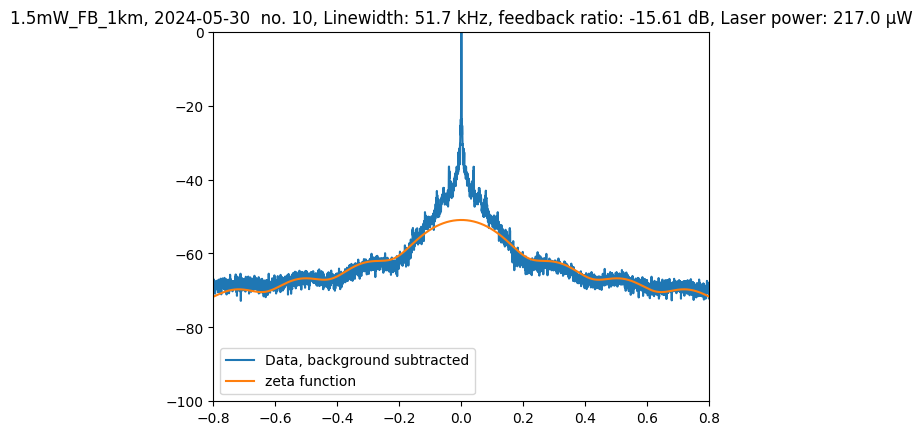

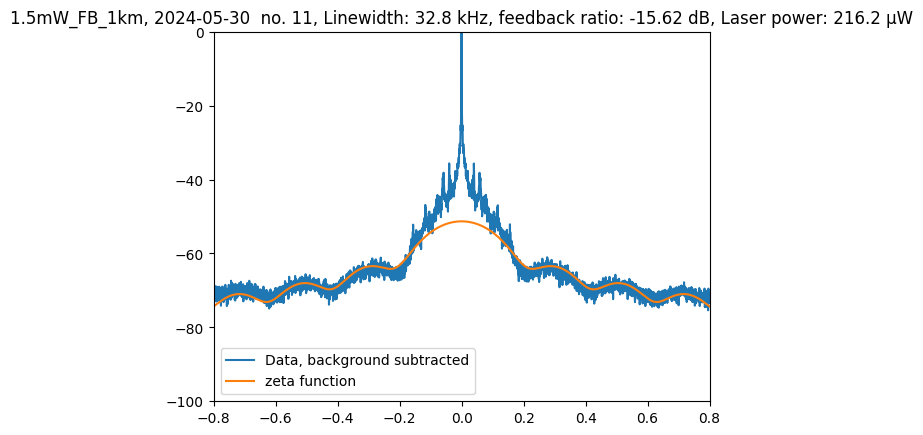

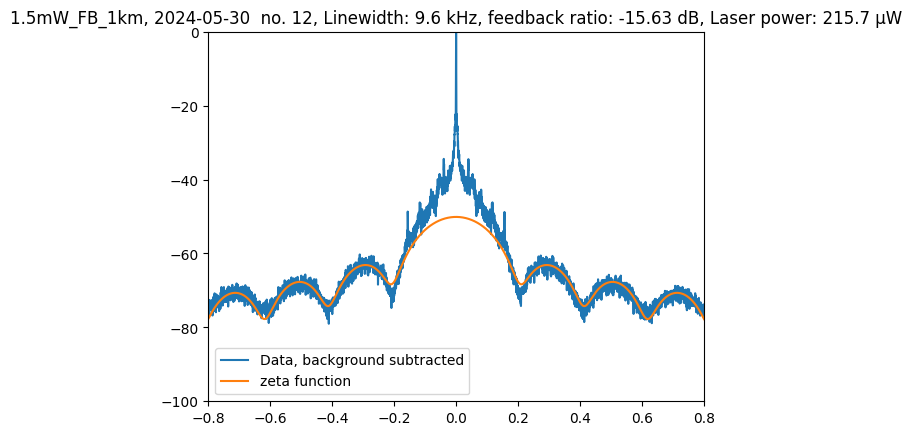

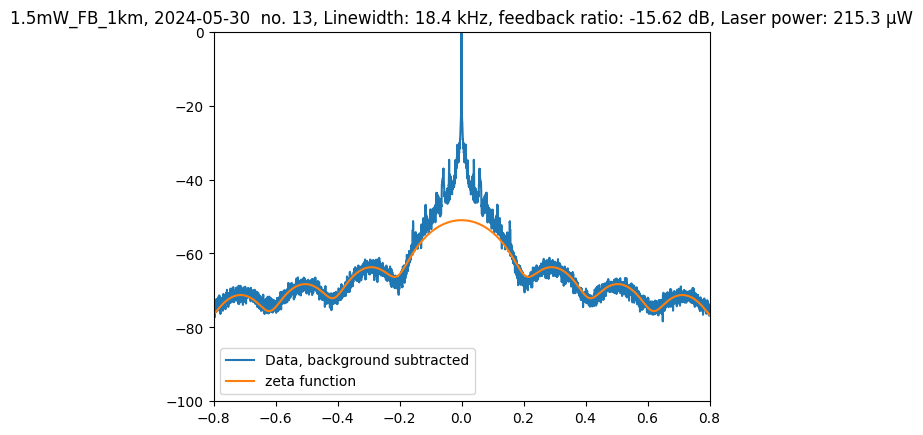

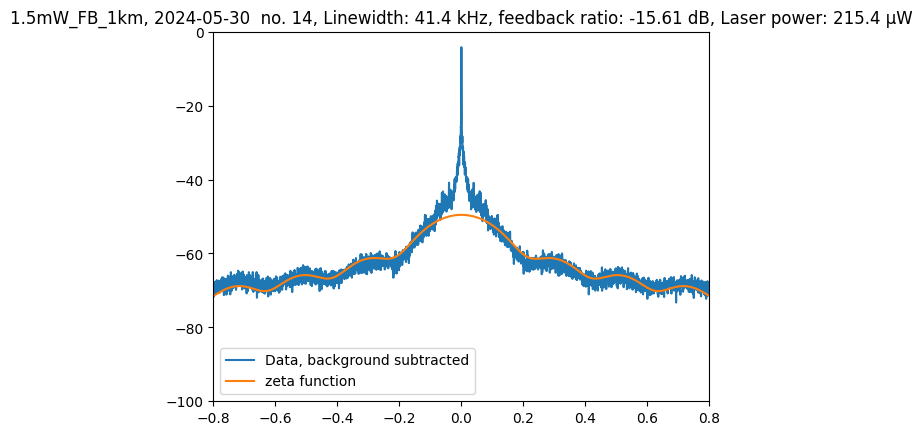

...

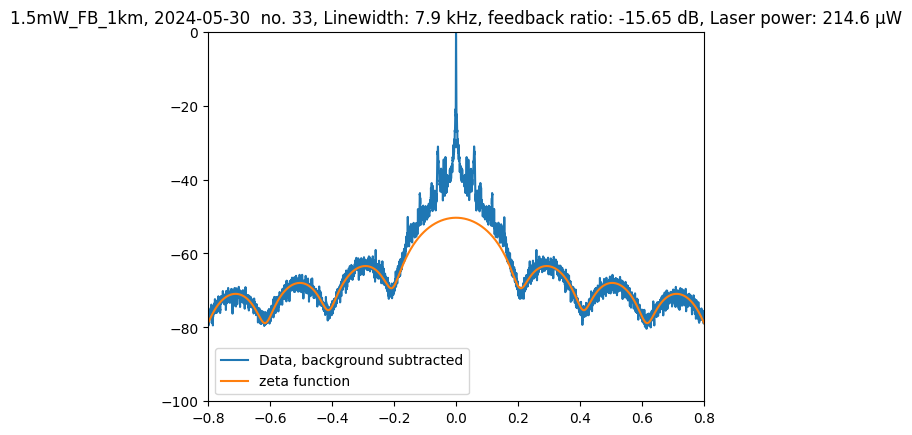

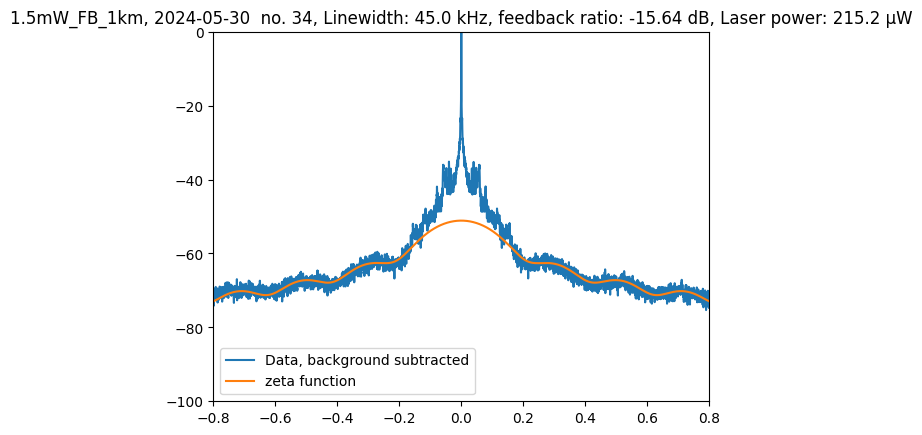

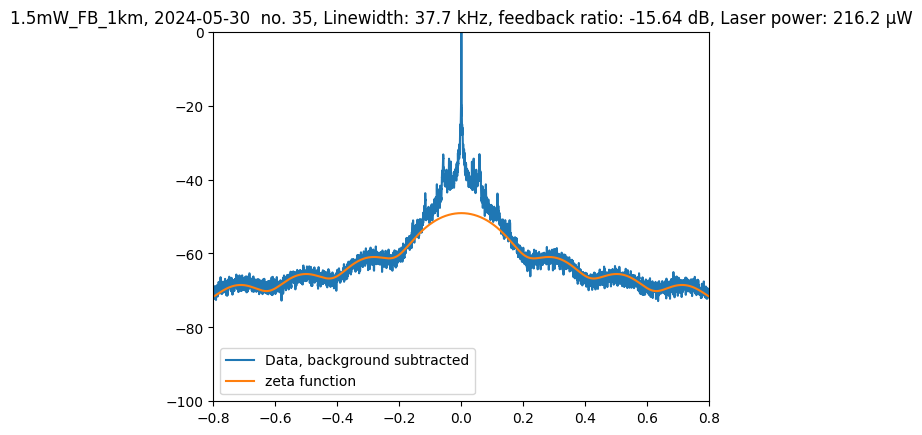

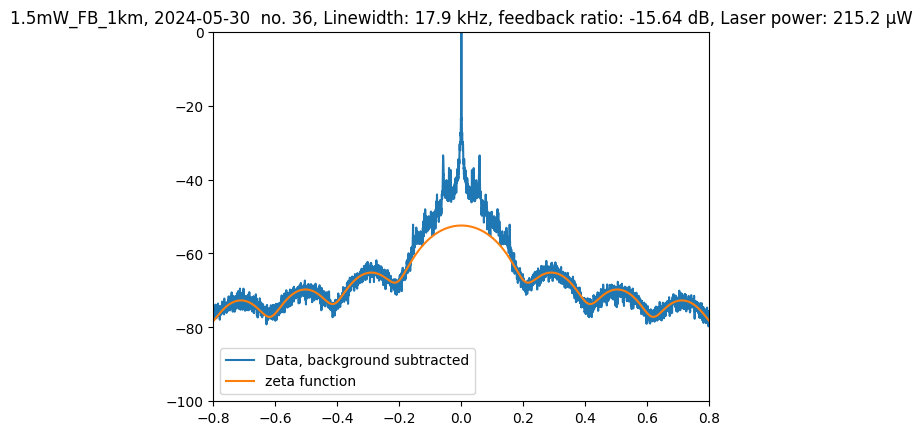

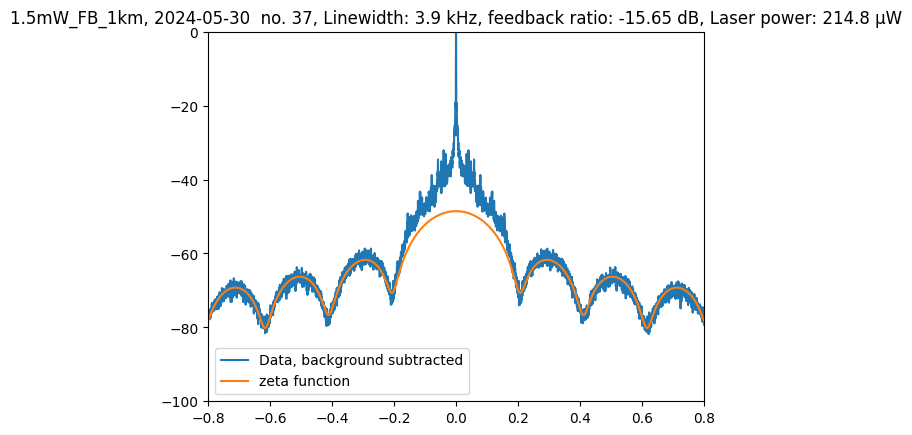

In [13]:
# range_of_zeta = [list(range(1,10)) + list(range(11,12)) + list(range(13,29))] # + list(range(66,69))
# range_of_zeta.append(list(range(5,7)) + list(range(8,40)) + list(range(42,63)) + list(range(67,70))) # + list(range(66,69))
# range_of_zeta.append(list(range(20,36)) + list(range(38,41)))
# range_of_zeta.append(list(range(24,25)) + list(range(26,32)) + list(range(33,35)) + list(range(36,37)) + list(range(66,88)) + list(range(90,94)) + list(range(95,96)) + list(range(97,98)) + list(range(99,102)))
# range_of_zeta.append(list(range(13,19)) + list(range(34,43)) + list(range(49,52)))
# range_of_zeta.append( list(range(9,18)) + list(range(34,52)) )
# range_of_zeta.append( list(range(72)) + list(range(73,102)) )
# range_of_zeta.append( list(range(9))) 


#list_of_dicts_zeta = [[{} for _ in range(len(range_of_zeta[i]))] for i in range(3)]
#linewidth_zeta= [[] for _ in range(3)]
#feedback_ratios_zeta = [[] for _ in range(3)]
#laser_powers_zeta = [[] for _ in range(3)]
#feedback_powers_zeta = [[] for _ in range(3)]



linewidths_1km =[[None for _ in range(len(dirs_1km[i][1]))] for i in range(datasets_no_1km)]

smsrs_1km = [[None for _ in range(len(dirs_1km[i][1]))] for i in range(datasets_no_1km)]


for data_index in range(datasets_no_1km):
    #for number, i in enumerate(range_of_zeta[data_index]):
    
    for i in range(len(dirs_1km[data_index][1])):
            
        if dirs_1km[data_index][1][i] ==None:
            pass
        else:
            
            #fs, ps = dp.get_close_spectrum_from_folder(dirs[i],plot=False,center_about_carrier=True)

            fs = measurements_1km[data_index][i][0]
            ps = measurements_1km[data_index][i][1] - max(measurements_1km[data_index][i][1])

            # if data_index == 0 or data_index ==9:
            #     filter = (abs(fs) > 0.2) & (abs(fs) < 0.7)
            # else:
            filter = (abs(fs) > 0.2) & (abs(fs) < 0.8)


            if data_index < 3:
                params, whatevs = curve_fit(ff.zeta_fit,fs[filter]*10**6,ps[filter],p0=[3*10**4,25,1140],bounds=((1e2,-100,900),(9e4,100,1300)))
            else:
                params, whatevs = curve_fit(ff.zeta_fit,fs[filter]*10**6,ps[filter],p0=[6*10**3,25,1140], bounds=((1e2,-100,900),(9e4,100,1300)))




            linewidths_1km[data_index][i] = params[0]
            #linewidth_lor.append(params[0])


            laser_power = laser_powers_1km[data_index][i]
            feedback_power = feedback_powers_1km[data_index][i]

            feedback_ratio = feedback_ratios_1km[data_index][i]

            filter_zeta_plot = abs(fs) < 1

            fs_full = dirs_1km[data_index][0][i].freqs 
            ps_full = dirs_1km[data_index][0][i].powers

            smsrs_1km[data_index][i] = get_smsr(fs_full,ps_full,80,12.5)

            if data_index >= datasets_no_1km-1:
                plt.figure()
                plt.plot(fs,ps, label = 'Data, background subtracted')
                plt.plot(fs[filter_zeta_plot],ff.zeta_fit(fs[filter_zeta_plot]*10**6,params[0],params[1],params[2]), label = 'zeta function')
                plt.title(f'{data_dirs_1km[data_index][105:-23]}, {data_dirs_1km[data_index][-10:]}  no. {i}, Linewidth: {params[0]*1e-3:.1f} kHz, feedback ratio: {feedback_ratio:.2f} dB, Laser power: {laser_power*1e6:.1f} µW')
                plt.legend()

                plt.xlim([-0.8,0.8])
                plt.ylim([-100,0])


Linewidth: 103886.42429678714, offset: 34.132608103836574, delay length: 629.4824699223891


c:\Users\au617810\.conda\envs\conda_env\Lib\site-packages\uslib\fit_functions.py:81: RuntimeWarning: invalid value encountered in log10
  return 10*np.log10(zeta_func(freq,linewidth,time_delay(length)))+offset


Linewidth: 19368.436098015132, offset: 38.70208973228855, delay length: 998.0886896680244
Linewidth: 11230.952321466684, offset: 33.885795542342244, delay length: 997.5319079071851
Linewidth: 8574.427123381249, offset: 29.85876790326214, delay length: 996.6992982151386
Linewidth: 5849.432515620198, offset: 29.850081434081716, delay length: 995.4116271949604
Linewidth: 4558.646836953093, offset: 29.211442690099073, delay length: 995.7074675272623
Linewidth: 3600.0081002500397, offset: 28.31903498057615, delay length: 995.7951553232341


C:\Users\au617810\AppData\Local\Temp\ipykernel_17660\3919444079.py:97: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


Linewidth: 2424.368217286293, offset: 26.515745911133294, delay length: 995.8574597179971
Linewidth: 3402.1092521206438, offset: 24.51708005148218, delay length: 995.3657865984092


c:\Users\au617810\.conda\envs\conda_env\Lib\site-packages\uslib\fit_functions.py:81: RuntimeWarning: invalid value encountered in log10
  return 10*np.log10(zeta_func(freq,linewidth,time_delay(length)))+offset


Linewidth: 2976.936207588575, offset: 30.301396971968362, delay length: 995.4793750764198


c:\Users\au617810\.conda\envs\conda_env\Lib\site-packages\uslib\fit_functions.py:81: RuntimeWarning: invalid value encountered in log10
  return 10*np.log10(zeta_func(freq,linewidth,time_delay(length)))+offset


Linewidth: 2327.6274977124235, offset: 30.52542329694665, delay length: 994.9914428161217
Linewidth: 2159.0791808970307, offset: 22.690635737561085, delay length: 995.8276056527144
Linewidth: 1997.055628697014, offset: 20.257146746077158, delay length: 995.297212072148
Linewidth: 1556.1070001278333, offset: 27.256286799630935, delay length: 995.4628813203365
Linewidth: 1685.5796207542712, offset: 23.243088089771945, delay length: 995.3227793795971
Linewidth: 1591.8185611790682, offset: 23.848703295060798, delay length: 995.7458550556715


c:\Users\au617810\.conda\envs\conda_env\Lib\site-packages\uslib\fit_functions.py:81: RuntimeWarning: invalid value encountered in log10
  return 10*np.log10(zeta_func(freq,linewidth,time_delay(length)))+offset


Linewidth: 1825.5196848791645, offset: 17.72863713435783, delay length: 995.8960699779652


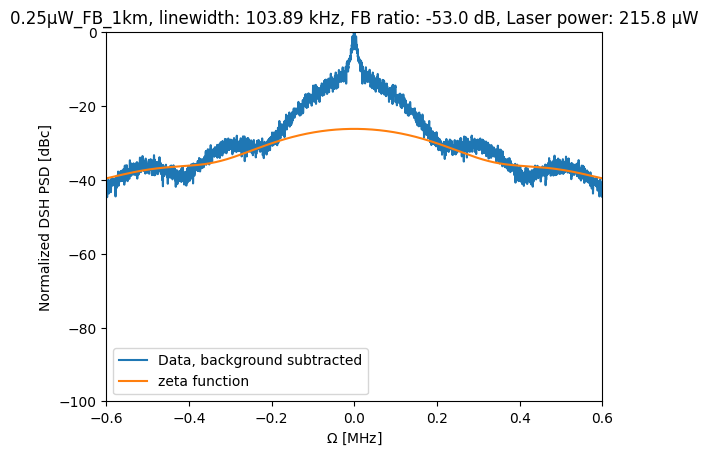

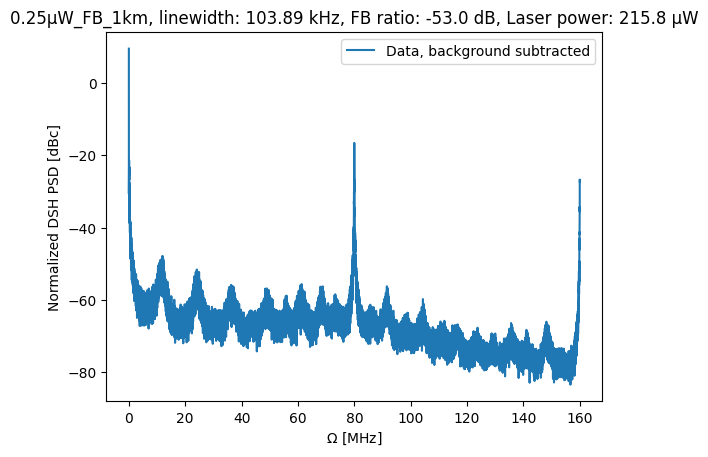

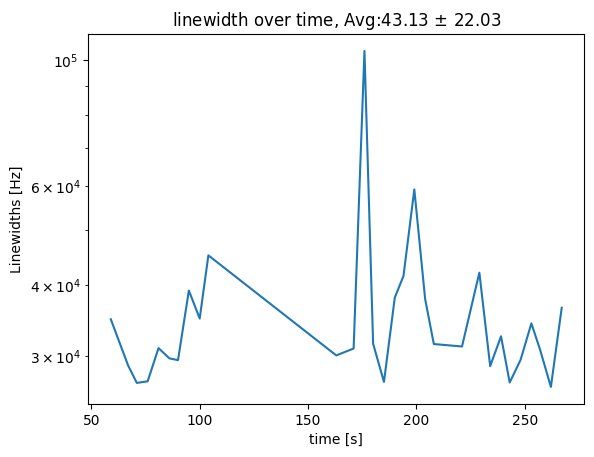

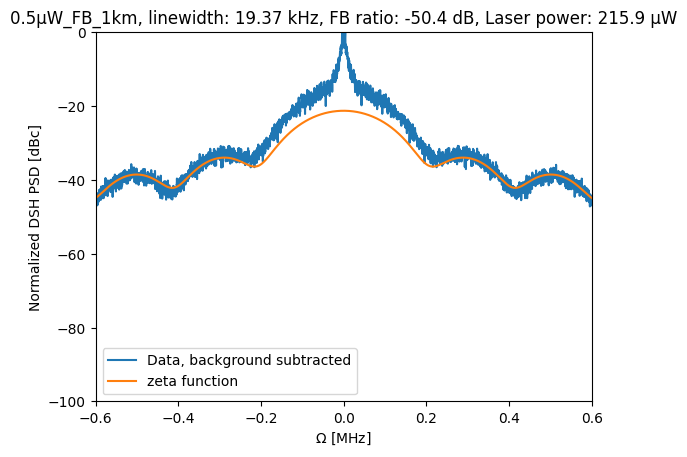

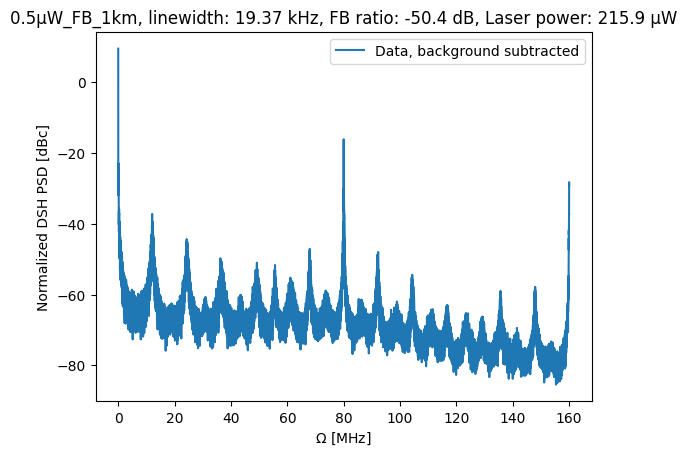

...

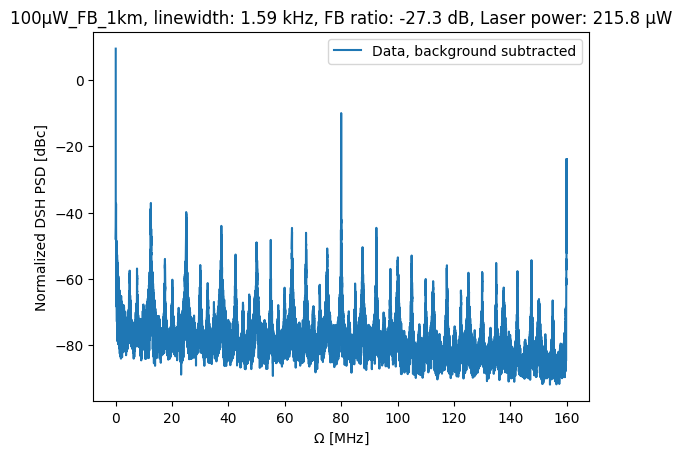

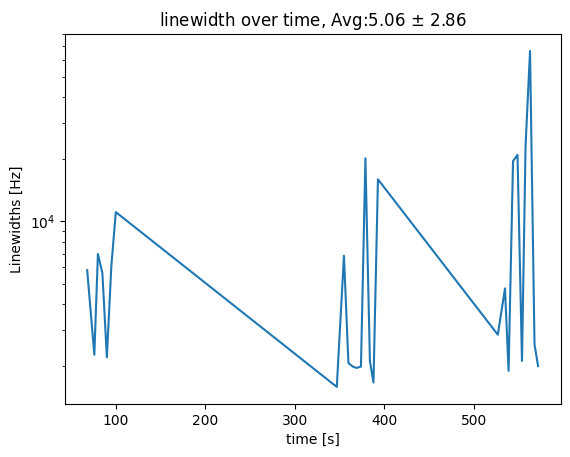

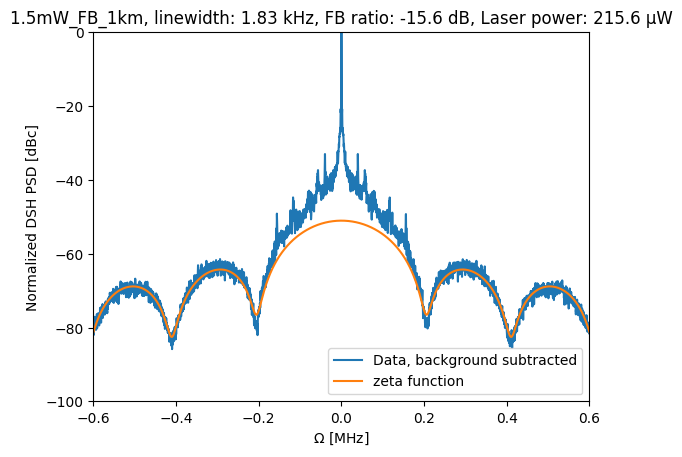

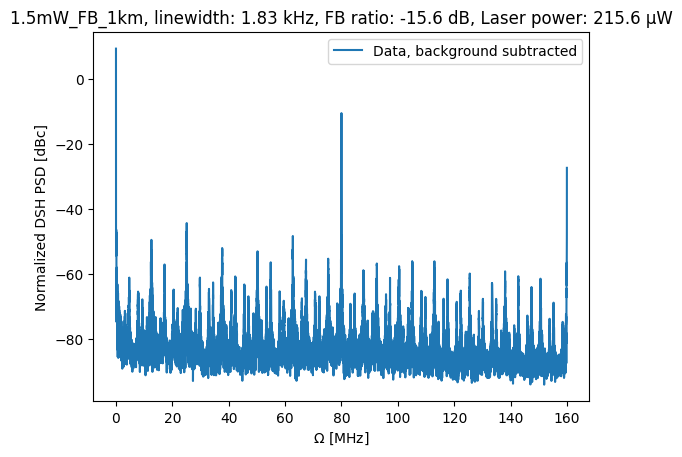

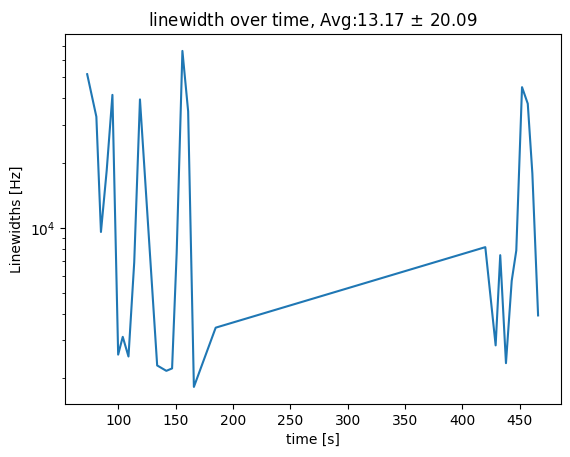

In [14]:
#Saving the plots with the lowest linewidths

best_linewidths_1km = [[None for _ in range(datasets_no_1km)] for _ in range(6)]
list_around_best_linewidths_1km = [[] for _ in range(datasets_no_1km)]


for data_index in range(datasets_no_1km):

    lowest_linewidth = min([v for v in linewidths_1km[data_index] if v != None])

    i = linewidths_1km[data_index].index(lowest_linewidth)

    fs = measurements_1km[data_index][i][0]
    ps = measurements_1km[data_index][i][1] - max(measurements_1km[data_index][i][1])

    filter = (abs(fs) > 0.2) & (abs(fs) < 0.8)

    params, whatevs = curve_fit(ff.zeta_fit,fs[filter]*10**6,ps[filter],p0=[3*10**3,25,1140])

    print(f'Linewidth: {params[0]}, offset: {params[1]}, delay length: {params[2]}')


    linewidths_1km[data_index][i] = params[0]
    #linewidth_lor.append(params[0])


    laser_power = laser_powers_1km[data_index][i]
    feedback_power = feedback_powers_1km[data_index][i]

    feedback_ratio = feedback_ratios_1km[data_index][i]
    
    best_linewidths_1km[0][data_index] = feedback_ratio
    best_linewidths_1km[1][data_index] = lowest_linewidth
    best_linewidths_1km[2][data_index] = i

    list_around_best_linewidths_1km[data_index] = [v for v in linewidths_1km[data_index][i - i%10 : i - i%10 + 10] if v != None]

    best_linewidths_1km[3][data_index] = np.average(list_around_best_linewidths_1km[data_index]) #np.average(linewidths[data_index][i - i%10 : i - i%10 + 10]) #Average of block of 10 that the best linewidth has been measured in
    best_linewidths_1km[4][data_index] = np.std(list_around_best_linewidths_1km[data_index]) # 10 : i - i%10 + 10]) #Standard deviation around average in the block of 10 that the best linewidth has been measured in


    plt.figure()
    plt.plot(fs,ps, label = 'Data, background subtracted')
    plt.plot(fs,ff.zeta_fit(fs*10**6,params[0],params[1],params[2]), label = 'zeta function')
    plt.title(fr'{data_dirs_1km[data_index][105:-23]}, linewidth: {params[0]*1e-3:.2f} kHz, FB ratio: {feedback_ratio:.1f} dB, Laser power: {laser_power*1e6:.1f} µW')
    plt.legend()

    plt.xlim([-.6,.6])
    plt.ylim([-100,0])

    plt.xlabel(r'$\Omega$ [MHz]')
    plt.ylabel(r'Normalized DSH PSD [dBc]')

    try:
        if data_index == 0:
            os.chdir(r'C:\Users\au617810\OneDrive - Aarhus universitet\Videnskabelig assistent')
            os.mkdir(fr'.\Measurement spectra and plots\Linewidths\Analyzed_{date.today()}_1km')
    except:
        pass 
    
    #plt.savefig(fr'.\Measurement spectra and plots\Linewidths\Analyzed_{date.today()}_1km\{data_dirs_1km[data_index][96:]}_ESA_spectrum_zeta_fit_low_linewidth_best.pdf')
    #plt.savefig(fr'.\Measurement spectra and plots\Linewidths\Analyzed_{date.today()}_1km\{data_dirs_1km[data_index][96:]}_ESA_spectrum_zeta_fit_low_linewidth_best.png')


    fs_full = dirs_1km[data_index][0][i].freqs 
    ps_full = dirs_1km[data_index][0][i].powers


    smsr1 = 0
    if i > 0:
        if dirs_1km[data_index][0][i-1] != None: 
            fs_full1 = dirs_1km[data_index][0][i-1].freqs 
            ps_full1 = dirs_1km[data_index][0][i-1].powers
            smsr1 = get_smsr(fs_full1,ps_full1,80,12.5)

    smsr = get_smsr(fs_full,ps_full,80,12.5)

    best_linewidths_1km[5][data_index] = max([smsr, smsr1])


    plt.figure()
    plt.plot(fs_full,ps_full, label = 'Data, background subtracted')
    #plt.plot(fs_full,ff.zeta_fit(fs*10**6,params[0],params[1],params[2]), label = 'zeta function')
    plt.title(fr'{data_dirs_1km[data_index][105:-23]}, linewidth: {params[0]*1e-3:.2f} kHz, FB ratio: {feedback_ratio:.1f} dB, Laser power: {laser_power*1e6:.1f} µW')
    plt.legend()

    #plt.xlim([-.6,.6])
    #plt.ylim([-80,0])

    plt.xlabel(r'$\Omega$ [MHz]')
    plt.ylabel(r'Normalized DSH PSD [dBc]')
    

    plt.savefig(fr'.\Measurement spectra and plots\Linewidths\Analyzed_{date.today()}_1km\{data_dirs_1km[data_index][96:]}_ESA_full_spectrum_low_linewidth_best.pdf')
    plt.savefig(fr'.\Measurement spectra and plots\Linewidths\Analyzed_{date.today()}_1km\{data_dirs_1km[data_index][96:]}_ESA_full_spectrum_low_linewidth_best.png')

    plt.figure()
    plt.plot(start_times_1km[data_index],linewidths_1km[data_index])

    if len(list_around_best_linewidths_1km[data_index]) < 10:
        plt.title(fr'linewidth over time, Avg:{best_linewidths_1km[3][data_index]*1e-3:.2f} $\pm$ {best_linewidths_1km[4][data_index]*1e-3:.2f}, *{len(list_around_best_linewidths_1km[data_index])} in avg, std')
    else:
        plt.title(fr'linewidth over time, Avg:{best_linewidths_1km[3][data_index]*1e-3:.2f} $\pm$ {best_linewidths_1km[4][data_index]*1e-3:.2f}')

    plt.xlabel('time [s]')
    plt.ylabel('Linewidths [Hz]')
    plt.yscale('log')
    #plt.savefig(fr'.\Measurement spectra and plots\Linewidths\Analyzed_{date.today()}_1km\{data_dirs_1km[data_index][96:]}_linewidths_vs_time.pdf')
    #plt.savefig(fr'.\Measurement spectra and plots\Linewidths\Analyzed_{date.today()}_1km\{data_dirs_1km[data_index][96:]}_linewidths_vs_time.png')



In [15]:
data_dir_1550nm=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_1µW_FB_1550nmMeasurements_2024-05-31"

data_dir_1550nm1=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_2µW_FB_1550nmMeasurements_2024-05-31"

data_dir_1550nm2=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_4µW_FB_1550nmMeasurements_2024-05-31"

data_dir_1550nm3=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_6µW_FB_1550nmMeasurements_2024-05-31"

data_dir_1550nm4=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_10µW_FB_1550nmMeasurements_2024-05-31"

data_dir_1550nm5=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_20µW_FB_1550nmMeasurements_2024-05-31"

data_dir_1550nm6=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_30µW_FB_1550nmMeasurements_2024-05-31"

data_dir_1550nm7=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_50µW_FB_1550nmMeasurements_2024-05-31"

data_dir_1550nm8=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_100µW_FB_1550nmMeasurements_2024-05-31"

data_dir_1550nm9=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_500µW_FB_1550nmMeasurements_2024-05-31"

data_dir_1550nm10=r"O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_1.5mW_FB_1550nmMeasurements_2024-05-31"


data_dirs_1550nm = [data_dir_1550nm,data_dir_1550nm1,data_dir_1550nm2, data_dir_1550nm3, data_dir_1550nm4, data_dir_1550nm5, data_dir_1550nm6, data_dir_1550nm7, data_dir_1550nm8, data_dir_1550nm9, data_dir_1550nm10]
datasets_no_1550nm = len(data_dirs_1550nm)# len(data_dir_1550nms)

#path_coherent = r"C:\Users\au622616\OneDrive - Aarhus universitet\U shaped measurements\ESA_spectrum_Feedback measurement.txt"
dirs_1550nm= []

for i in range(datasets_no_1550nm):

    dirs_1550nm.append(ld.get_lab_session_data(data_dirs_1550nm[i]))

#ld.get_all_data()

In [16]:
measurements_1550nm = [[[]for _ in range(len(dirs_1550nm[i][1]))] for i in range(datasets_no_1550nm)]

laser_powers_1550nm = [[None for _ in range(len(dirs_1550nm[i][1]))] for i in range(datasets_no_1550nm)]
laser_lists_1550nm = [[[]for _ in range(len(dirs_1550nm[i][1]))] for i in range(datasets_no_1550nm)]
las_var_1550nm = [[None for _ in range(len(dirs_1550nm[i][1]))] for i in range(datasets_no_1550nm)]

feedback_powers_1550nm = [[None for _ in range(len(dirs_1550nm[i][1]))] for i in range(datasets_no_1550nm)]
fb_var_1550nm = [[None for _ in range(len(dirs_1550nm[i][1]))] for i in range(datasets_no_1550nm)]
feedback_lists_1550nm = [[[]for _ in range(len(dirs_1550nm[i][1]))] for i in range(datasets_no_1550nm)]


list_of_dicts_1550nm = [[{} for _ in range(len(dirs_1550nm[i][1]))] for i in range(datasets_no_1550nm)]

start_times_1550nm =[[None for _ in range(len(dirs_1550nm[i][1]))] for i in range(datasets_no_1550nm)]

for data_index in range(datasets_no_1550nm):
    #fig, ax = plt.subplots()
    #artists = []

    #if data_index < 3:
    for i, directory in enumerate(dirs_1550nm[data_index][1]): #Close spectrum is index 1
        
        if directory == None:
            pass
        else:
            fs = directory.freqs #Obtaining ESA close spectrum frequencies
            ps = directory.powers #Obtaining ESA close spectrum powers

            plot = False
        
            #fs, ps = dp.get_close_spectrum_from_folder(directory,plot=plot,center_about_carrier=True)

            measurements_1550nm[data_index][i] = fs, ps

            list_of_dicts_1550nm[data_index][i] = directory.params



            try:
                if dirs_1550nm[data_index][3].las_avg[i] != None: #If there is a separate laser file

                    laser_powers_1550nm[data_index][i] = dirs_1550nm[data_index][3].las_avg[i]
                    las_var_1550nm[data_index][i] = dirs_1550nm[data_index][3].las_var[i]
                    laser_lists_1550nm[data_index][i] =  dirs_1550nm[data_index][3].laser_powers[i]


                else:
                
                    laser_powers_1550nm[data_index][i] = list_of_dicts_1550nm[data_index][i]['Laser power']
                    las_var_1550nm[data_index][i] = None
            except AttributeError:
                
                pow_time_dict = dirs_1550nm[data_index][3][i]

                laser_lists_1550nm[data_index][i] = pow_time_dict['laser_power']

                laser_powers_1550nm[data_index][i] = np.average(pow_time_dict['laser_power'])

                las_var_1550nm[data_index][i] = np.var(pow_time_dict['laser_power'])


            try:    
                if dirs_1550nm[data_index][3].fb_avg[i] != None: #If there is a separate laser file

                    feedback_powers_1550nm[data_index][i] = dirs_1550nm[data_index][3].fb_avg[i] #Saves the average power pr measurement
                    fb_var_1550nm[data_index][i] = dirs_1550nm[data_index][3].fb_var[i]
                    feedback_lists_1550nm[data_index][i] =  dirs_1550nm[data_index][3].fb_powers[i]


                else:

                    feedback_powers_1550nm[data_index][i] = list_of_dicts_1550nm[data_index][i]['Feedback power']
                    fb_var_1550nm[data_index][i] = None
            except AttributeError:
                
                pow_time_dict = dirs_1550nm[data_index][3][i]

                feedback_lists_1550nm[data_index][i] = pow_time_dict['feedback_power']

                feedback_powers_1550nm[data_index][i] = np.average(pow_time_dict['feedback_power'])

                fb_var_1550nm[data_index][i] = np.var(pow_time_dict['feedback_power'])

            
            if plot:
                    
                plt.figure()
                plt.plot(fs,ps)
                plt.xlim([-0.6,0.6])
                plt.ylim([-120,-40])
                plt.xlabel('Frequency detuning [MHz]')
                plt.ylabel('Spectrum power [dBc]')
                plt.title(f'Plot number {i}')


            try:
                start_times_1550nm[data_index][i] = dirs_1550nm[data_index][3][i]['start_time']
            except:
                pass

feedback_ratios_1550nm = [[None for _ in range(len(dirs_1550nm[i][1]))] for i in range(datasets_no_1550nm)]

for data_index in range(datasets_no_1550nm):

    max_laser_power = max([value for value in laser_powers_1550nm[data_index] if value is not None])

    for i in range(len(dirs_1550nm[data_index][1])):
            
            laser_power = laser_powers_1550nm[data_index][i]
            feedback_power = feedback_powers_1550nm[data_index][i]

            if laser_power is not None:

                feedback_ratios_1550nm[data_index][i] = ld.feedback_ratio(laser_power,feedback_power,max_laser_power)

In [17]:
# range_of_zeta = [list(range(1,10)) + list(range(11,12)) + list(range(13,29))] # + list(range(66,69))
# range_of_zeta.append(list(range(5,7)) + list(range(8,40)) + list(range(42,63)) + list(range(67,70))) # + list(range(66,69))
# range_of_zeta.append(list(range(20,36)) + list(range(38,41)))
# range_of_zeta.append(list(range(24,25)) + list(range(26,32)) + list(range(33,35)) + list(range(36,37)) + list(range(66,88)) + list(range(90,94)) + list(range(95,96)) + list(range(97,98)) + list(range(99,102)))
# range_of_zeta.append(list(range(13,19)) + list(range(34,43)) + list(range(49,52)))
# range_of_zeta.append( list(range(9,18)) + list(range(34,52)) )
# range_of_zeta.append( list(range(72)) + list(range(73,102)) )
# range_of_zeta.append( list(range(9))) 


#list_of_dicts_zeta = [[{} for _ in range(len(range_of_zeta[i]))] for i in range(3)]
#linewidth_zeta= [[] for _ in range(3)]
#feedback_ratios_zeta = [[] for _ in range(3)]
#laser_powers_zeta = [[] for _ in range(3)]
#feedback_powers_zeta = [[] for _ in range(3)]

linewidths_1550nm =[[None for _ in range(len(dirs_1550nm[i][1]))] for i in range(datasets_no_1550nm)]

smsrs_1550nm = [[None for _ in range(len(dirs_1550nm[i][1]))] for i in range(datasets_no_1550nm)]


for data_index in range(datasets_no_1550nm):
    #for number, i in enumerate(range_of_zeta[data_index]):
    
    for i in range(len(dirs_1550nm[data_index][1])):
            
        if dirs_1550nm[data_index][1][i] ==None:
            pass
        else:
            
            #fs, ps = dp.get_close_spectrum_from_folder(dirs[i],plot=False,center_about_carrier=True)

            fs = measurements_1550nm[data_index][i][0]
            ps = measurements_1550nm[data_index][i][1] - max(measurements_1550nm[data_index][i][1])

            # if data_index == 0 or data_index ==9:
            #     filter = (abs(fs) > 0.2) & (abs(fs) < 0.7)
            # else:
            filter = (abs(fs) > 0.2) & (abs(fs) < 0.4)



            params, whatevs = curve_fit(ff.zeta_fit,fs[filter]*10**6,ps[filter],p0=[3*10**3,25,3140],bounds=((1e2,-100,2800),(35e3,100,3400)))



            linewidths_1550nm[data_index][i] = params[0]
            #linewidth_lor.append(params[0])


            laser_power = laser_powers_1550nm[data_index][i]
            feedback_power = feedback_powers_1550nm[data_index][i]

            feedback_ratio = feedback_ratios_1550nm[data_index][i]

            filter_zeta_plot = abs(fs) < 0.6


            fs_full = dirs_1550nm[data_index][0][i].freqs 
            ps_full = dirs_1550nm[data_index][0][i].powers

            smsrs_1550nm[data_index][i] = get_smsr(fs_full,ps_full,80,12.5)



            # plt.figure()
            # plt.plot(fs,ps, label = 'Data, background subtracted')
            # plt.plot(fs[filter_zeta_plot],ff.zeta_fit(fs[filter_zeta_plot]*10**6,params[0],params[1],params[2]), label = 'zeta function')
            # plt.title(f'{data_dirs_1550nm[data_index][105:-23]}, {data_dirs_1550nm[data_index][-10:]}  no. {i}, Linewidth: {params[0]*1e-3:.1f} kHz, feedback ratio: {feedback_ratio:.2f} dB, Laser power: {laser_power*1e6:.1f} µW')
            # plt.legend()

            # plt.xlim([-0.8,0.8])
            # plt.ylim([-100,0])

Linewidth: 3104.8590319811497, offset: 31.509702892229303, delay length: 3137.406580054787
Linewidth: 1445.7537457366816, offset: 31.208872833066323, delay length: 3136.188806583898


c:\Users\au617810\.conda\envs\conda_env\Lib\site-packages\uslib\fit_functions.py:81: RuntimeWarning: invalid value encountered in log10
  return 10*np.log10(zeta_func(freq,linewidth,time_delay(length)))+offset


Linewidth: 904.3837883648409, offset: 29.345969620347145, delay length: 3136.4315548261125


c:\Users\au617810\.conda\envs\conda_env\Lib\site-packages\uslib\fit_functions.py:81: RuntimeWarning: invalid value encountered in log10
  return 10*np.log10(zeta_func(freq,linewidth,time_delay(length)))+offset


Linewidth: 743.8839629349459, offset: 28.240694302216166, delay length: 3135.2157477128444


c:\Users\au617810\.conda\envs\conda_env\Lib\site-packages\uslib\fit_functions.py:81: RuntimeWarning: invalid value encountered in log10
  return 10*np.log10(zeta_func(freq,linewidth,time_delay(length)))+offset


Linewidth: 908.037531359301, offset: 26.101897833538377, delay length: 3136.0128116976925


c:\Users\au617810\.conda\envs\conda_env\Lib\site-packages\uslib\fit_functions.py:81: RuntimeWarning: invalid value encountered in log10
  return 10*np.log10(zeta_func(freq,linewidth,time_delay(length)))+offset


Linewidth: 510.0933772757224, offset: 26.472738802052795, delay length: 3137.9273405949207


c:\Users\au617810\.conda\envs\conda_env\Lib\site-packages\uslib\fit_functions.py:81: RuntimeWarning: invalid value encountered in log10
  return 10*np.log10(zeta_func(freq,linewidth,time_delay(length)))+offset


Linewidth: 437.73229879919677, offset: 22.32626698706011, delay length: 3135.9592646393367


C:\Users\au617810\AppData\Local\Temp\ipykernel_17660\4071278393.py:98: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()
c:\Users\au617810\.conda\envs\conda_env\Lib\site-packages\uslib\fit_functions.py:81: RuntimeWarning: invalid value encountered in log10
  return 10*np.log10(zeta_func(freq,linewidth,time_delay(length)))+offset


Linewidth: 296.92912758174083, offset: 21.964128005478944, delay length: 3136.926393981679


c:\Users\au617810\.conda\envs\conda_env\Lib\site-packages\uslib\fit_functions.py:81: RuntimeWarning: invalid value encountered in log10
  return 10*np.log10(zeta_func(freq,linewidth,time_delay(length)))+offset


Linewidth: 301.4968728889794, offset: 23.5382721842129, delay length: 3136.0087881989525


c:\Users\au617810\.conda\envs\conda_env\Lib\site-packages\uslib\fit_functions.py:81: RuntimeWarning: invalid value encountered in log10
  return 10*np.log10(zeta_func(freq,linewidth,time_delay(length)))+offset


Linewidth: 417.4853089695034, offset: 27.018426854766023, delay length: 3135.34845669138


c:\Users\au617810\.conda\envs\conda_env\Lib\site-packages\uslib\fit_functions.py:81: RuntimeWarning: invalid value encountered in log10
  return 10*np.log10(zeta_func(freq,linewidth,time_delay(length)))+offset


Linewidth: 429.33244347679107, offset: 18.049998205324552, delay length: 3135.6090707658286


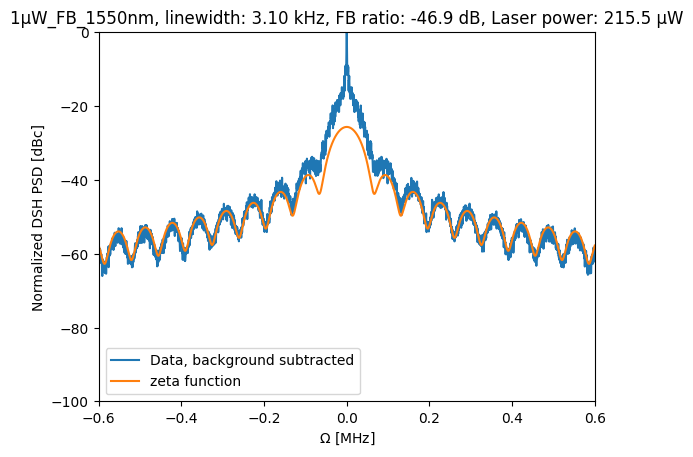

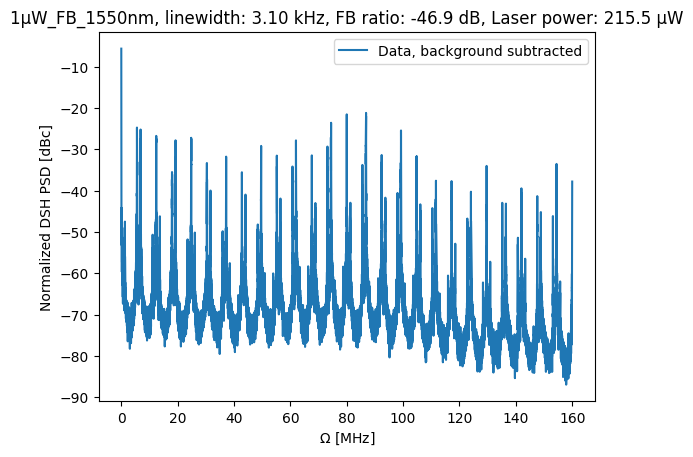

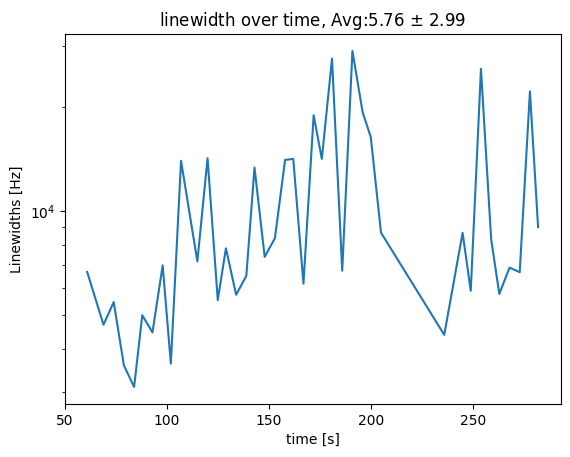

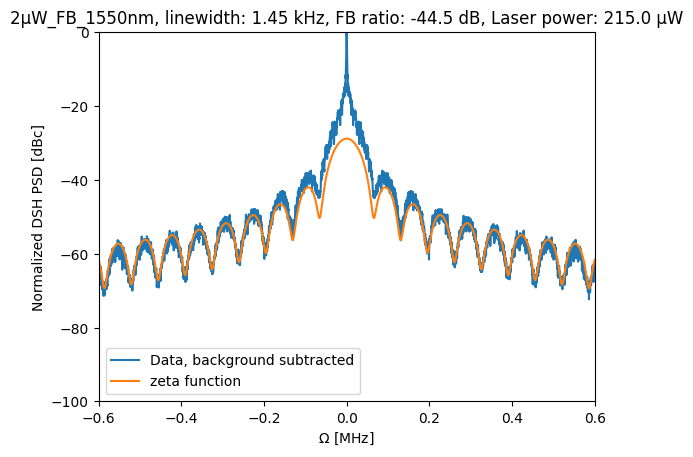

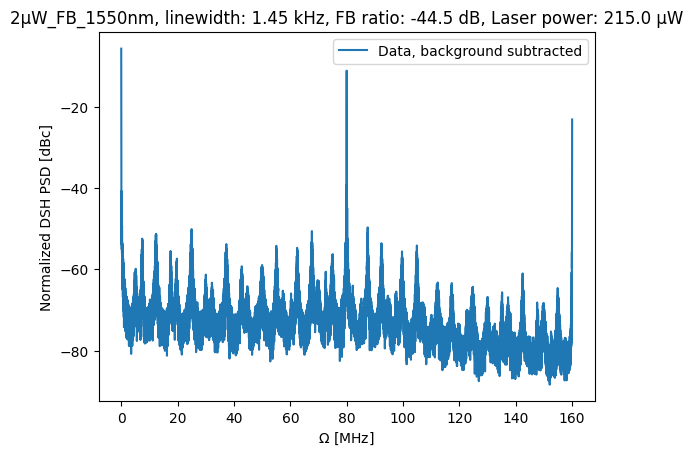

...

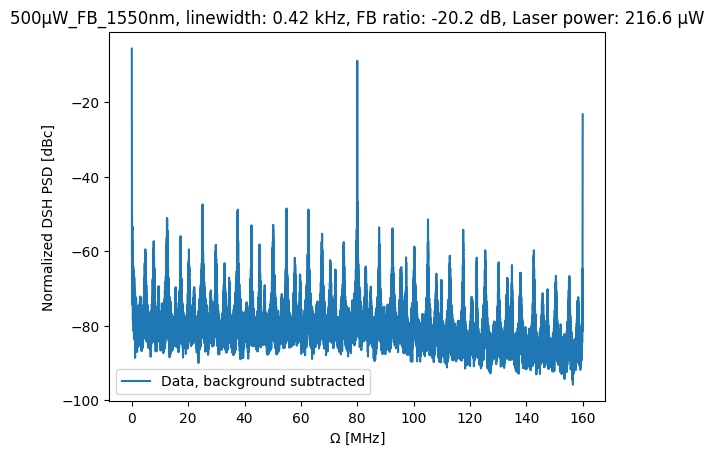

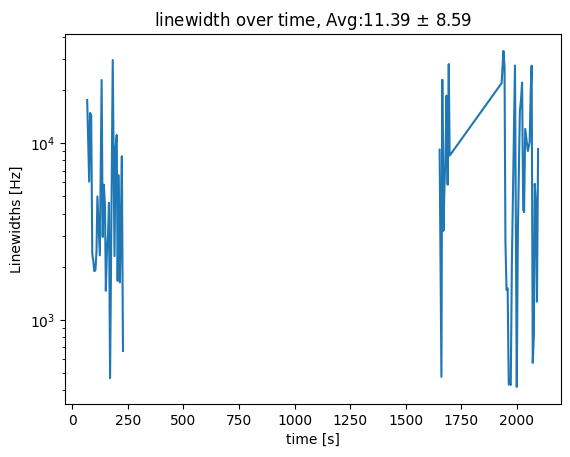

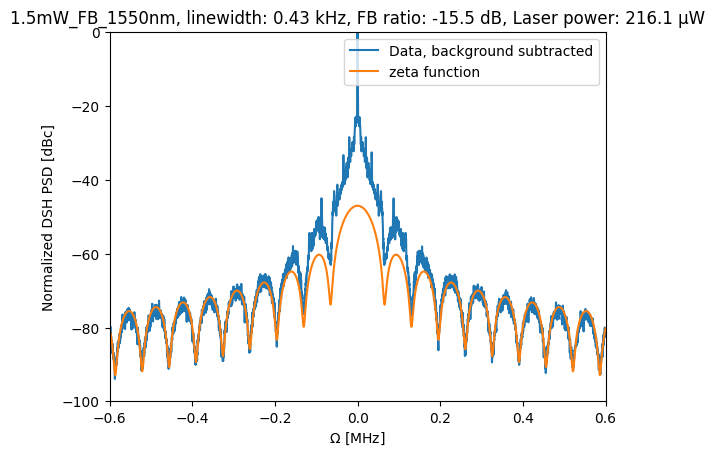

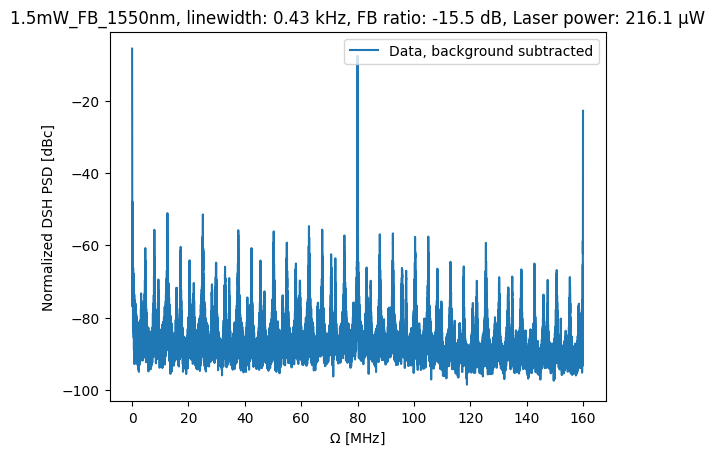

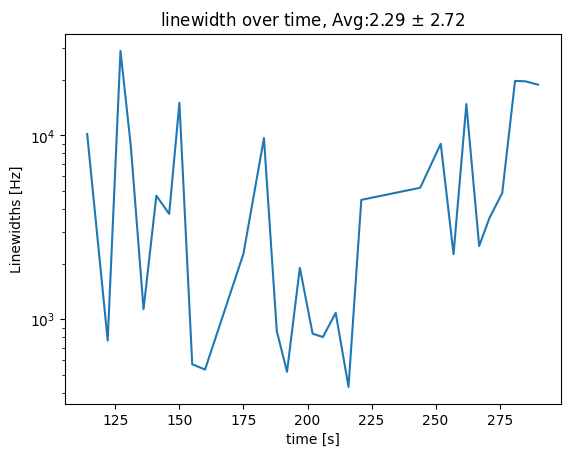

In [18]:
#Saving the plots with the lowest linewidths

best_linewidths_1550nm = [[None for _ in range(datasets_no_1550nm)] for _ in range(6)]
list_around_best_linewidths_1550nm = [[] for _ in range(datasets_no_1550nm)]


for data_index in range(datasets_no_1550nm):

    lowest_linewidth = min([v for v in linewidths_1550nm[data_index] if v != None])

    i = linewidths_1550nm[data_index].index(lowest_linewidth)

    fs = measurements_1550nm[data_index][i][0]
    ps = measurements_1550nm[data_index][i][1] - max(measurements_1550nm[data_index][i][1])

    filter = (abs(fs) > 0.2) & (abs(fs) < 0.4)

    params, whatevs = curve_fit(ff.zeta_fit,fs[filter]*10**6,ps[filter],p0=[3*10**3,25,3140])

    print(f'Linewidth: {params[0]}, offset: {params[1]}, delay length: {params[2]}')


    linewidths_1550nm[data_index][i] = params[0]
    #linewidth_lor.append(params[0])


    laser_power = laser_powers_1550nm[data_index][i]
    feedback_power = feedback_powers_1550nm[data_index][i]

    feedback_ratio = feedback_ratios_1550nm[data_index][i]

    best_linewidths_1550nm[0][data_index] = feedback_ratio
    best_linewidths_1550nm[1][data_index] = lowest_linewidth
    best_linewidths_1550nm[2][data_index] = i #Best index
    
    list_around_best_linewidths_1550nm[data_index] = [v for v in linewidths_1550nm[data_index][i - i%10 : i - i%10 + 10] if v != None] 

    best_linewidths_1550nm[3][data_index] = np.average(list_around_best_linewidths_1550nm[data_index]) #Average of block of 10 that the best linewidth has been measured in
    best_linewidths_1550nm[4][data_index] = np.std(list_around_best_linewidths_1550nm[data_index]) # 10 : i - i%10 + 10]) #Standard deviation around average in the block of 10 that the best linewidth has been measured in


    plt.figure()
    plt.plot(fs,ps, label = 'Data, background subtracted')
    plt.plot(fs,ff.zeta_fit(fs*10**6,params[0],params[1],params[2]), label = 'zeta function')
    plt.title(fr'{data_dirs_1550nm[data_index][105:-23]}, linewidth: {params[0]*1e-3:.2f} kHz, FB ratio: {feedback_ratio:.1f} dB, Laser power: {laser_power*1e6:.1f} µW')
    plt.legend()

    plt.xlim([-.6,.6])
    plt.ylim([-100,0])

    plt.xlabel(r'$\Omega$ [MHz]')
    plt.ylabel(r'Normalized DSH PSD [dBc]')

    try:
        if data_index == 0:
            os.chdir(r'C:\Users\au617810\OneDrive - Aarhus universitet\Videnskabelig assistent')
            os.mkdir(fr'.\Measurement spectra and plots\Linewidths\Analyzed_{date.today()}_1550nm')
    except:
        pass
    
    #plt.savefig(fr'.\Measurement spectra and plots\Linewidths\Analyzed_{date.today()}_1550nm\{data_dirs_1550nm[data_index][96:]}_ESA_spectrum_zeta_fit_low_linewidth_best.pdf')
    #plt.savefig(fr'.\Measurement spectra and plots\Linewidths\Analyzed_{date.today()}_1550nm\{data_dirs_1550nm[data_index][96:]}_ESA_spectrum_zeta_fit_low_linewidth_best.png')



    fs_full = dirs_1550nm[data_index][0][i].freqs 
    ps_full = dirs_1550nm[data_index][0][i].powers


    smsr1 = 0
    if i > 0:
        if dirs_1550nm[data_index][0][i-1] != None: 
            fs_full1 = dirs_1550nm[data_index][0][i-1].freqs 
            ps_full1 = dirs_1550nm[data_index][0][i-1].powers
            smsr1 = get_smsr(fs_full1,ps_full1,80,12.5)

    smsr = get_smsr(fs_full,ps_full,80,12.5)

    best_linewidths_1550nm[5][data_index] = max([smsr, smsr1])

    plt.figure()
    plt.plot(fs_full,ps_full, label = 'Data, background subtracted')
    #plt.plot(fs_full,ff.zeta_fit(fs*10**6,params[0],params[1],params[2]), label = 'zeta function')
    plt.title(fr'{data_dirs_1550nm[data_index][105:-23]}, linewidth: {params[0]*1e-3:.2f} kHz, FB ratio: {feedback_ratio:.1f} dB, Laser power: {laser_power*1e6:.1f} µW')
    plt.legend()

    #plt.xlim([-.6,.6])
    #plt.ylim([-80,0])

    plt.xlabel(r'$\Omega$ [MHz]')
    plt.ylabel(r'Normalized DSH PSD [dBc]')
    

    plt.savefig(fr'.\Measurement spectra and plots\Linewidths\Analyzed_{date.today()}_1550nm\{data_dirs_1550nm[data_index][96:]}_ESA_full_spectrum_low_linewidth_best.pdf')
    plt.savefig(fr'.\Measurement spectra and plots\Linewidths\Analyzed_{date.today()}_1550nm\{data_dirs_1550nm[data_index][96:]}_ESA_full_spectrum_low_linewidth_best.png')


    plt.figure()
    plt.plot(start_times_1550nm[data_index],linewidths_1550nm[data_index])
    if len(list_around_best_linewidths_1km[data_index]) < 10:
        plt.title(fr'linewidth over time, Avg:{best_linewidths_1550nm[3][data_index]*1e-3:.2f} $\pm$ {best_linewidths_1550nm[4][data_index]*1e-3:.2f}, *{len(list_around_best_linewidths_1550nm[data_index])} in avg, std')
    else:
        plt.title(fr'linewidth over time, Avg:{best_linewidths_1550nm[3][data_index]*1e-3:.2f} $\pm$ {best_linewidths_1550nm[4][data_index]*1e-3:.2f}')
    plt.xlabel('time [s]')
    plt.ylabel('Linewidths [Hz]')
    plt.yscale('log')
    #plt.savefig(fr'.\Measurement spectra and plots\Linewidths\Analyzed_{date.today()}_1550nm\{data_dirs_1550nm[data_index][96:]}_linewidths_vs_time.pdf')
    #plt.savefig(fr'.\Measurement spectra and plots\Linewidths\Analyzed_{date.today()}_1550nm\{data_dirs_1550nm[data_index][96:]}_linewidths_vs_time.png')


Text(0, 0.5, 'SMSR [dB]')

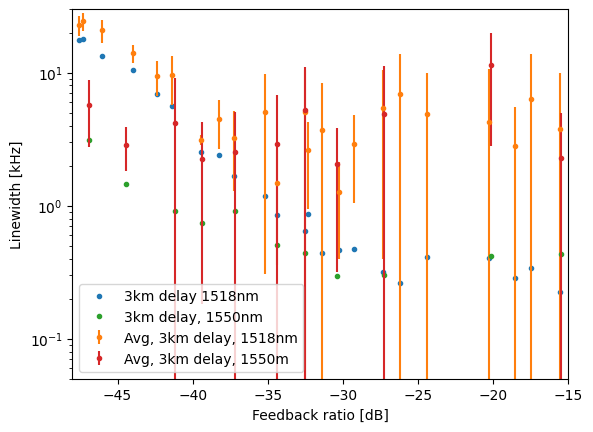

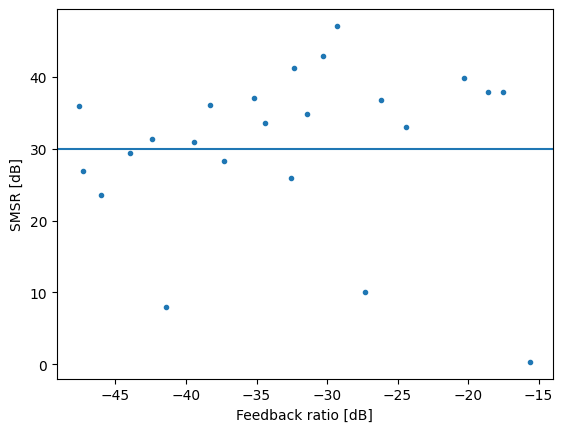

In [19]:
x = np.linspace(-48,-15,1000)

plt.figure()

best_linewidths_mod = [[],[],[],[],[],[]]

best_linewidths_mod[0]  = list(np.delete(best_linewidths[0][:30],[1,2,15,17,19,20,24])) #Removing points which where remeasured due to bad polarization
best_linewidths_mod[1] = list(np.delete(best_linewidths[1][:30],[1,2,15,17,19,20,24])) #Removing points which where remeasured due to bad polarization

best_linewidths_mod[5] = list(np.delete(best_linewidths[5][:30],[1,2,15,17,19,20,24]))


best_linewidths_mod_avg = list(np.delete(best_linewidths[3][:30],[1,2,15,17,19,20,24]))
best_linewidths_mod_std = list(np.delete(best_linewidths[4][:30],[1,2,15,17,19,20,24]))

#plt.plot(best_linewidths[0],10*np.log10(np.array(best_linewidths[1])),'.')
#plt.plot(best_linewidths[0],np.array(best_linewidths[1])*1e-3,'.', label='3km delay')
plt.plot(best_linewidths_mod[0],np.array(best_linewidths_mod[1])*1e-3,'.', label='3km delay 1518nm')

plt.errorbar(best_linewidths_mod[0],np.array(best_linewidths_mod_avg)*1e-3, yerr = np.array(best_linewidths_mod_std)*1e-3, label = 'Avg, 3km delay, 1518nm', fmt = '.')


#plt.plot(best_linewidths_1km[0],np.array(best_linewidths_1km[1])*1e-3,'.', label='1km delay')
plt.plot(best_linewidths_1550nm[0],np.array(best_linewidths_1550nm[1])*1e-3,'.', label='3km delay, 1550nm')
#plt.plot(best_linewidths[0][30:],np.array(best_linewidths[1][30:])*1e-3, '.', label = '3km delay, 1518nm auto meas')
plt.errorbar(best_linewidths_1550nm[0],np.array(best_linewidths_1550nm[3])*1e-3, yerr = np.array(best_linewidths_1550nm[4])*1e-3, label = 'Avg, 3km delay, 1550m', fmt = '.')



#plt.plot(x,0.85*abs(x)+3)
#plt.plot(x,abs(x)-4.3)
#plt.plot(x,20*np.exp(-abs(x+48)/4.34), label = '$20 e^{-|x+48|/4.34}$')
#plt.plot(x,3*np.exp(-abs(x+48)/8), label = '$3 e^{-|x+48|/8}$')

plt.yscale('log')
plt.ylabel('Linewidth [kHz]')
plt.xlabel('Feedback ratio [dB]')
plt.xlim([-48,-15])
plt.ylim([0.05,30])
plt.legend()


try:
    os.mkdir(fr'.\Measurement spectra and plots\Linewidths\Analyzed_{date.today()}_linewidth_vs_fb')
except:
    pass 

plt.savefig(fr'.\Measurement spectra and plots\Linewidths\Analyzed_{date.today()}_linewidth_vs_fb\linewidth_vs_FB_1550nm,1518nm_modified.pdf')
plt.savefig(fr'.\Measurement spectra and plots\Linewidths\Analyzed_{date.today()}_linewidth_vs_fb\linewidth_vs_FB_1550nm,1518nm_modified.png')

plt.figure()
plt.plot(best_linewidths_mod[0],best_linewidths_mod[5],'.')
plt.axhline(30)
plt.xlabel('Feedback ratio [dB]')
plt.ylabel('SMSR [dB]')

#plt.savefig(fr'.\Measurement spectra and plots\Linewidths\Analyzed_{date.today()}_linewidth_vs_FB_1550nm,1518nm.pdf')
#plt.savefig(fr'.\Measurement spectra and plots\Linewidths\Analyzed_{date.today()}_linewidth_vs_FB_1550nm,1518nm.png')

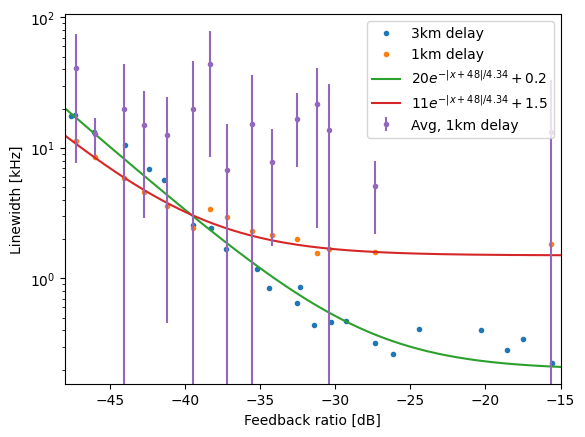

In [20]:
x = np.linspace(-50,-15,1000)

plt.figure()

#plt.plot(best_linewidths[0],10*np.log10(np.array(best_linewidths[1])),'.',label = '3km delay')
#plt.plot(best_linewidths_1km[0],10*np.log10(np.array(best_linewidths_1km[1])),'.', label='1km delay')
plt.plot(best_linewidths_mod[0],np.array(best_linewidths_mod[1])*1e-3,'.',label='3km delay')
plt.plot(best_linewidths_1km[0],np.array(best_linewidths_1km[1])*1e-3,'.', label='1km delay')


#plt.plot(x,0.85*abs(x)+3)
#plt.plot(x,abs(x)-4.3)
#plt.plot(x,10**(abs(x)/10-3.5), label = '$10^{|x|/10-3.5}$')
plt.plot(x,20*np.exp(-abs(x+48)/4.34)+0.2, label = '$20 e^{-|x+48|/4.34}+0.2$')
plt.plot(x,11*np.exp(-abs(x+48)/4.34)+1.5, label = '$11 e^{-|x+48|/4.34}+1.5$')

plt.errorbar(best_linewidths_1km[0],np.array(best_linewidths_1km[3])*1e-3, yerr = np.array(best_linewidths_1km[4])*1e-3, label = 'Avg, 1km delay', fmt = '.')



try:
    os.mkdir(fr'.\Measurement spectra and plots\Linewidths\Analyzed_{date.today()}_linewidth_vs_fb')
except:
    pass

#plt.plot(x,np.exp(abs(x)/10-10))
plt.yscale('log')
plt.ylabel('Linewidth [kHz]')
plt.xlabel('Feedback ratio [dB]')
plt.xlim([-48,-15])
plt.legend()
plt.savefig(fr'.\Measurement spectra and plots\Linewidths\Analyzed_{date.today()}_linewidth_vs_fb\linewidth_vs_FB_1km,3km.pdf')
plt.savefig(fr'.\Measurement spectra and plots\Linewidths\Analyzed_{date.today()}_linewidth_vs_fb\linewidth_vs_FB_1km,3km.png')

In [21]:
def R_squared(data,fitfunc_evaluated): #Goodness of fit
    
    return (((data-fitfunc_evaluated))**2).sum()/len(data) #/ ((data-data.mean())**2).sum()

In [22]:
xs  = np.arange(-70,-40,0.1)
x_zeta = np.arange(-38,-15,0.1)

def fitfunc(xs,a,b):
    
    return a*xs+b

In [23]:
params_zeta = [[] for _ in range(datasets_no)]
for i in range(datasets_no):
        
    plt.figure()
    param_zeta, whatevs_zeta = curve_fit(fitfunc,np.array(feedback_ratios[i])[range_of_zeta[i]],10*np.log10(np.array(linewidths[i])[range_of_zeta[i]]))

    params_zeta[i] = param_zeta

    plt.plot(np.array(feedback_ratios[i])[range_of_zeta[i]],10*np.log10(np.array(linewidths[i])[range_of_zeta[i]]),'.')
    #plt.plot(xs,fitfunc(xs,params_lin[0],params_lin[1]))

    #plt.plot(feedback_ratios_zeta,10*np.log10(np.array(linewidth_zeta)),'.')
    plt.plot(x_zeta,fitfunc(x_zeta,params_zeta[i][0]-0.3,params_zeta[i][1]-7))

    plt.title(f'Linear fit, {data_dirs[i][96:]}, fitted slope - 0.3: {params_zeta[i][0] - 0.3:.2f}')
    plt.xlabel('Feedback ratio [dB]')
    plt.ylabel('Linewidth [dB]?')

    try:
        if i == 0:
            os.chdir(r'C:\Users\au617810\OneDrive - Aarhus universitet\Videnskabelig assistent')
            os.mkdir(fr'.\Measurement spectra and plots\Linewidths\Analyzed_{date.today()}_linewidth_vs_fb')
        else:
            pass
    except:
        pass

    plt.savefig(fr'.\Measurement spectra and plots\Linewidths\Analyzed_{date.today()}_linewidth_vs_fb\Linewidth vs feedback ratio lin fit {data_dirs[i][96:]}.png')
    plt.savefig(fr'.\Measurement spectra and plots\Linewidths\Analyzed_{date.today()}_linewidth_vs_fb\Linewidth vs feedback ratio lin fit {data_dirs[i][96:]}.pdf')

NameError: name 'range_of_zeta' is not defined

<Figure size 640x480 with 0 Axes>

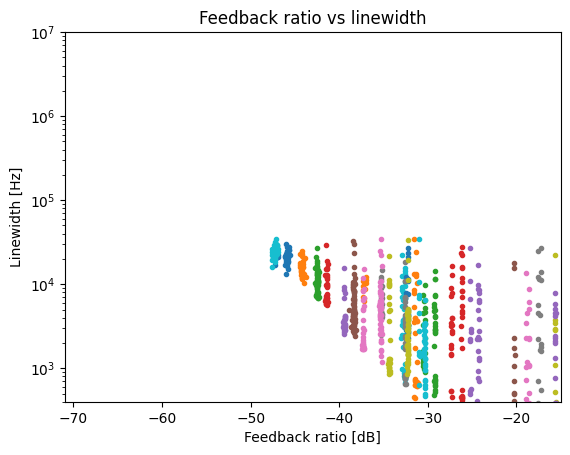

In [ ]:

plt.figure()

for data_index in range(datasets_no):

    if data_index == 1:
        plt.plot(feedback_ratios[data_index], linewidths[data_index], '.', label = f'Gaussian, zeta fit, {data_dirs[data_index][96:]}, log avg')
        #plt.plot(feedback_ratios,np.array(linewidth_lor),'.', label = 'Lorentzian fit')

    else: 
        plt.plot(feedback_ratios[data_index], linewidths[data_index], '.', label = f'Gaussian, zeta fit, {data_dirs[data_index][96:]}')
        #plt.plot(np.array(feedback_ratios[data_index])[range_of_incoherent[data_index]], linewidth_gauss[data_index], '.', label = f'Gaussian fit, {data_dirs[data_index][96:]}')
        #plt.plot(feedback_ratios,np.array(linewidth_lor),'.', label = 'Lorentzian fit')
        #plt.plot(np.array(feedback_ratios[data_index])[range_of_zeta[data_index]], linewidth_zeta[data_index],'.', label = f'Zeta fit, {data_dirs[data_index][96:]}')

    plt.title('Feedback ratio vs linewidth')
    plt.xlabel('Feedback ratio [dB]')
    plt.ylabel('Linewidth [Hz]')
    #plt.plot(xs,np.exp(fitfunc(xs,params_lin[0]))
    plt.ylim([4*10**2,10**7])
    plt.yscale('log')

    try:
        if data_index == 0:
            os.mkdir(fr'.\Measurement spectra and plots\Linewidths\Analyzed_{date.today()}_linewidth_vs_fb')
        else:
            pass
    except:
        pass

    #plt.legend(loc='lower left')
    plt.xlim([-71,-15])
    #plt.savefig(fr'.\Measurement spectra and plots\Linewidths\Analyzed_{date.today()}_linewidth_vs_fb\Linewidth vs feedback ratio.png')
    #plt.savefig(fr'.\Measurement spectra and plots\Linewidths\Analyzed_{date.today()}_linewidth_vs_fb\Linewidth vs feedback ratio.pdf')

In [ ]:
# for data_index in range(datasets_no_1km):
#     for i in range(len(feedback_ratios_1km[data_index])):
#         if feedback_ratios_1km[data_index][i] == []:
#             feedback_ratios_1km[data_index][i] = None

In [136]:
def lw_narrowing(fb_power_in_dB,v_0,beta):
    c = 299792458 #m/s
    tau =1#?
    #beta=800
    alpha = 3 #Linewidth enhancement factor
    omega = 2*np.pi*193.41448903*1e12 #Hz
    L_ext = 12 #meters
    tau_ext = L_ext/c

    f_ext = 10**(fb_power_in_dB/10) #P_ext/P_0 ratio, going from dB to ratio

    return v_0/(1+tau*beta*np.sqrt(f_ext)*np.cos(0*omega*tau_ext+np.arctan(alpha)))**2

def lw_broadening(fb_power_in_dB,v_0,beta):
    c = 299792458 #m/s
    tau =1#?
    #beta=800
    alpha = 0 #Linewidth enhancement factor
    omega = 2*np.pi*193.41448903*1e12 #Hz
    L_ext = 12 #meters
    tau_ext = L_ext/c

    f_ext = 10**(fb_power_in_dB/10) #P_ext/P_0 ratio, going from dB to ratio

    return v_0/(1+tau*beta*np.sqrt(f_ext)*np.cos(0*omega*tau_ext+np.arctan(alpha)))**2


fb_power_input = np.linspace(-75,-10,1000)

In [ ]:
10*np.log10(8*10**(-5+2.5))

-15.969100130080564

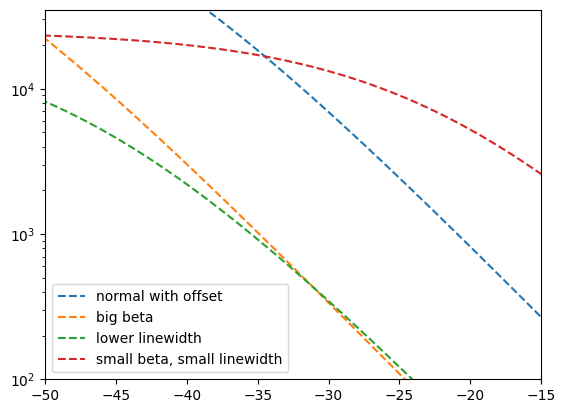

In [ ]:
plt.figure() 
beta = 750
v_0  = 5e5
offset = 0 #-np.exp(-fb_power_input/5)
plt.plot(fb_power_input,lw_narrowing(fb_power_input,v_0,beta),'--',label = f'normal with offset')
plt.plot(fb_power_input,lw_narrowing(fb_power_input,v_0,beta*5),'--',label = 'big beta')
plt.plot(fb_power_input,lw_narrowing(fb_power_input,v_0/20,beta),'--', label = 'lower linewidth')
plt.plot(fb_power_input,lw_narrowing(fb_power_input,v_0/20,beta/20),'--', label = 'small beta, small linewidth')

plt.legend()

plt.ylim([1e2,35e3])
plt.xlim([-50,-15])
plt.yscale('log')


In [134]:
def outlier_sorting(dataset):

    new_dataset = [None for _ in range(len(dataset))]
    filter_outlier = [False for _ in range(len(dataset))]


    None_filter = np.array(dataset) != None

    filter_dataset = np.array(dataset)[None_filter]

    method = 'midpoint'

    iqr_number = iqr(filter_dataset, interpolation=method)

    Q1 = np.percentile(filter_dataset,25,method=method)
    
    Q3 = np.percentile(filter_dataset,75,method=method)


    for i,datapoint in enumerate(dataset):
        if datapoint != None:
            if (datapoint < Q3+1.5*iqr_number and datapoint > Q1-1.5*iqr_number):

                new_dataset[i] = datapoint
                filter_outlier[i] = True

    return new_dataset, filter_outlier

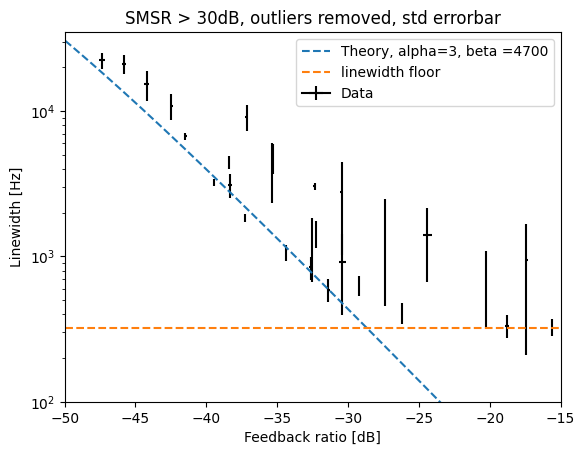

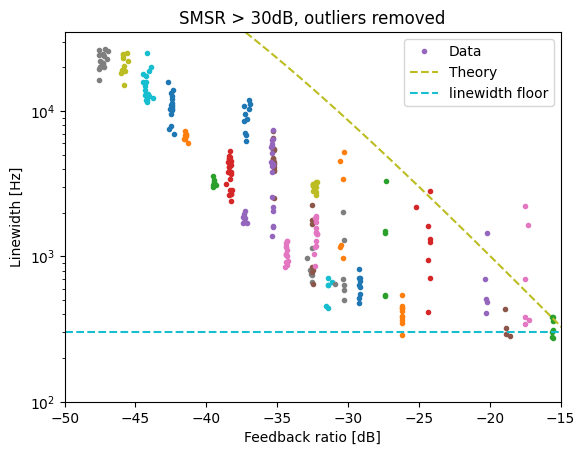

In [ ]:
filtered_linewidths = [[None for _ in range(len(linewidths[data_index]))] for data_index in range(datasets_no)]
# indices = [[] for _ in range(datasets_no)]

smsr_cutoff = 30

for data_index in range(datasets_no):
    for i in range(0,len(smsrs[data_index])): #Assuming that all the linewidth measurement were taken with the zoom spectrum first and then the full spectrum..
            if (smsrs[data_index][i] is not None): # and smsrs[data_index][i+1] is not None):
                if (smsrs[data_index][i] > smsr_cutoff): # and smsrs[data_index][i+1] > 35):
                    filtered_linewidths[data_index][i] = linewidths[data_index][i]
                    # indices[data_index].append(i)


for data_index in range(datasets_no):  
    
    if sum(np.array(filtered_linewidths[data_index])!=None) > 3: #Outlier sorting doesn't work for n<=3, so only take datasets with 4 datapoints or more.
        _,smsr_filter = outlier_sorting(filtered_linewidths[data_index])

        
        if data_index == 5:
            plt.figure(1)
            plt.plot(np.array(feedback_ratios[data_index])[smsr_filter],np.array(filtered_linewidths[data_index])[smsr_filter],'.',label='Data')
            
            plt.figure(2)
            #plt.errorbar(np.average(np.array(feedback_ratios[data_index])[smsr_filter]),np.average(np.array(filtered_linewidths[data_index])[smsr_filter]),yerr=np.std(np.array(filtered_linewidths[data_index])[smsr_filter]),xerr=np.std(np.array(feedback_ratios[data_index])[smsr_filter]))
            plt.errorbar(np.average(np.array(feedback_ratios[data_index])[smsr_filter]),np.average(np.array(filtered_linewidths[data_index])[smsr_filter]),yerr=np.std(np.array(filtered_linewidths[data_index])[smsr_filter]),xerr=np.std(np.array(feedback_ratios[data_index])[smsr_filter]),label='Data',color='k')        
        else:
            plt.figure(1)
            plt.plot(np.array(feedback_ratios[data_index])[smsr_filter],np.array(filtered_linewidths[data_index])[smsr_filter],'.',label='_no_legend')
            plt.figure(2)
            #plt.errorbar(np.average(np.array(feedback_ratios[data_index])[smsr_filter]),np.average(np.array(filtered_linewidths[data_index])[smsr_filter]),yerr=np.std(np.array(filtered_linewidths[data_index])[smsr_filter]),xerr=np.std(np.array(feedback_ratios[data_index])[smsr_filter]))
            plt.errorbar(np.average(np.array(feedback_ratios[data_index])[smsr_filter]),np.average(np.array(filtered_linewidths[data_index])[smsr_filter]),yerr=np.std(np.array(filtered_linewidths[data_index])[smsr_filter]),xerr=np.std(np.array(feedback_ratios[data_index])[smsr_filter]),label='_no_legend',color='k')
plt.yscale('log')
plt.xlabel('Feedback ratio [dB]')
plt.ylabel('Linewidth [Hz]')
plt.title(f'SMSR > {smsr_cutoff}dB, outliers removed, std errorbar')
plt.ylim([1e2,35e3])
plt.xlim([-50,-15])
beta_value = 47e2
plt.plot(fb_power_input,lw_narrowing(fb_power_input,10e5,beta_value),'--',label=f'Theory, alpha=3, beta ={beta_value:.0f}')
#plt.plot(fb_power_input,lw_narrowing(fb_power_input,1e6,15e2),'--',label='Theory2')
plt.plot(fb_power_input,np.ones(len(fb_power_input))*3.2e2,'--',label='linewidth floor')
plt.legend()


#plt.savefig(fr'C:\Users\au617810\OneDrive - Aarhus universitet\Videnskabelig assistent\Measurement spectra and plots\Linewidts_FB_IQR\1518nm_SMSR_errorbars.pdf')


plt.figure(1)
plt.title(f'SMSR > {smsr_cutoff}dB, outliers removed')
plt.yscale('log')
plt.xlabel('Feedback ratio [dB]')
plt.ylabel('Linewidth [Hz]')
plt.ylim([1e2,35e3])
plt.xlim([-50,-15])
plt.plot(fb_power_input,lw_narrowing(fb_power_input,7e5,800),'--',label='Theory')
plt.plot(fb_power_input,np.ones(len(fb_power_input))*3e2,'--',label='linewidth floor')
plt.legend()

#plt.savefig(fr'C:\Users\au617810\OneDrive - Aarhus universitet\Videnskabelig assistent\Measurement spectra and plots\Linewidts_FB_IQR\1518nm_SMSR_datapoints.pdf')



In [ ]:
for data_index in range(datasets_no):
    smsr_list = [smsrdata for smsrdata in smsrs[data_index] if smsrdata != None]
    smsr_max = max(smsr_list)
    if smsr_max > 40:
        smsr_max_index = smsr_list.index(smsr_max)
        print(smsr_max,data_index,smsr_max_index)

print(data_dirs[22],linewidths[22][24:26])

42.984517097473145 2 10
45.120978355407715 3 2
42.5719690322876 4 28
42.96975088119507 6 7
42.79381275177002 7 9
43.280710220336914 8 9
43.515931606292725 13 12
41.12999200820923 14 8
42.74525165557861 15 24
44.3096981048584 17 25
43.68734312057495 20 8
47.12046957015991 22 24
42.25387954711914 23 22
44.77916479110718 24 0
41.03618144989014 25 26
40.77580451965332 26 42
42.69974946975708 27 21
41.31386852264404 28 23
43.07182550430298 29 36
O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_64µW_FBMeasurements_2024-05-29 [724.4314336204483, 1841.0427995551624]


In [ ]:
for data_index in range(datasets_no_1km):
    smsr_list = [smsrdata for smsrdata in smsrs_1km[data_index] if smsrdata != None]

    smsr_max = max(smsr_list)
    if smsr_max > 40:
        smsr_max_index = smsr_list.index(smsr_max)
        print(smsr_max,data_index,smsr_max_index)

print(data_dirs_1km[16],linewidths_1km[16][21:23])

40.586063385009766 0 1
40.77499866485596 3 0
42.482168197631836 4 8
44.72988224029541 5 32
45.9462833404541 6 17
43.866421699523926 7 29
43.19564247131348 8 9
43.17218494415283 9 15
41.654887199401855 10 22
45.43103885650635 11 27
40.72281742095947 12 25
46.05414009094238 13 17
48.19999027252197 14 0
43.39580249786377 15 5
50.005008697509766 16 21
O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_1.5mW_FB_1kmMeasurements_2024-05-30 [2167.8332062897057, 2225.0873134742315]


In [ ]:
for data_index in range(datasets_no_1550nm):
    smsr_list = [smsrdata for smsrdata in smsrs_1550nm[data_index] if smsrdata != None]

    smsr_max = max(smsr_list)

    if smsr_max > 40:
        smsr_max_index = smsr_list.index(smsr_max)
        print(smsr_max,data_index,smsr_max_index)

print(data_dirs_1550nm[10],linewidths_1550nm[10][18:20])

44.38065719604492 0 1
45.442952156066895 1 14
46.43400716781616 2 2
43.43494510650635 3 23
44.1605281829834 4 25
41.960679054260254 5 22
42.39375877380371 6 13
44.71841049194336 7 23
44.94206714630127 9 51
48.029369831085205 10 18
O:\Tech_Photonics\Projects\Narrow Linewidth\MFB Chips\Chip 3 Feedback measurements\Linewidth_pol_control_1.5mW_FB_1550nmMeasurements_2024-05-31 [570.4758070306, 533.5844345861083]


FB level is -47.47382926998961 +/- 0.14148399093657282, linewidth is 23142.50229381462 +/- 2502.23799878105
FB level is -44.29350267527187 +/- 0.0916137215657558, linewidth is 13829.52872479018 +/- 2107.9930461023077
FB level is -42.457819422440764 +/- 0.01006910195022463, linewidth is 11045.938332717456 +/- 1058.11205649619
FB level is -41.4610510400289 +/- 0.04882845246285944, linewidth is 6899.466348412333 +/- 41.84150081696862
FB level is -38.38567211667504 +/- 0.06350258769145323, linewidth is 4859.173681894992 +/- 532.1017224822382
FB level is -35.26116641873917 +/- 0.02296293658205227, linewidth is 5212.852630528681 +/- 1151.5925245832798
FB level is -32.36328535294082 +/- 0.10145597747460348, linewidth is 3014.351805118844 +/- 182.96426642317448
FB level is -26.179798227911625 +/- 0.0067866765114380076, linewidth is 427.96823508983266 +/- 26.66064120068548
FB level is -15.575111523460356 +/- 0.01115219553816163, linewidth is 322.1336786153014 +/- 44.246128888149364


(100.0, 35000.0)

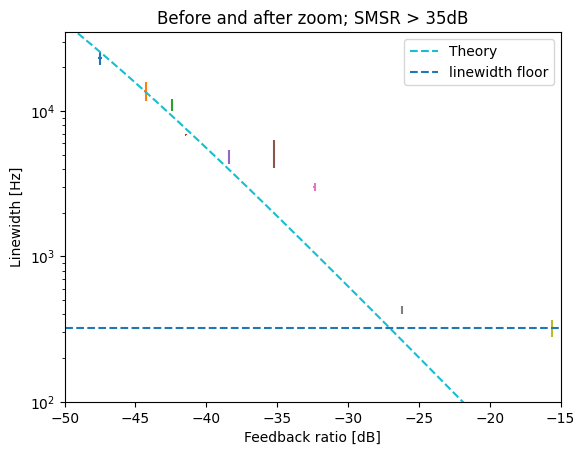

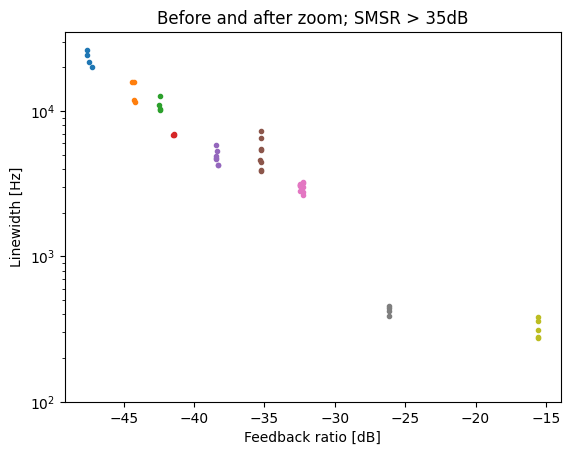

In [149]:
double_filtered_linewidths = [[None for _ in range(len(linewidths[data_index]))] for data_index in range(datasets_no)]
# indices = [[] for _ in range(datasets_no)]

smsr_cutoff = 35

for data_index in range(datasets_no):
    for i in range(0,len(smsrs[data_index])): #Assuming that all the linewidth measurement were taken with the zoom spectrum first and then the full spectrum.(they most likely are, as a readme from 16th of May has the reverse order when mentioning counts)

            if i%10 == 0:
                pass
                # if smsrs[data_index][i] is not None:
                #     if smsrs[data_index][i] > smsr_cutoff+7:
                #         double_filtered_linewidths[data_index][i] = linewidths[data_index][i]
            
            elif (smsrs[data_index][i-1] is not None and smsrs[data_index][i] is not None):
                if (smsrs[data_index][i-1] > smsr_cutoff and smsrs[data_index][i] > smsr_cutoff):
                    double_filtered_linewidths[data_index][i] = linewidths[data_index][i]
                    # indices[data_index].append(i)

for data_index in range(datasets_no):
    
    
    if sum(np.array(double_filtered_linewidths[data_index])!=None) > 3: #Outlier sorting doesn't work for n<=3, so only take datasets with 4 datapoints or more.
        _,smsr_filter = outlier_sorting(double_filtered_linewidths[data_index])
        plt.figure(1)
        plt.plot(np.array(feedback_ratios[data_index])[smsr_filter],np.array(double_filtered_linewidths[data_index])[smsr_filter],'.')
        plt.figure(2)
        plt.errorbar(np.average(np.array(feedback_ratios[data_index])[smsr_filter]),np.average(np.array(double_filtered_linewidths[data_index])[smsr_filter]),yerr=np.std(np.array(double_filtered_linewidths[data_index])[smsr_filter]),xerr=np.std(np.array(feedback_ratios[data_index])[smsr_filter]))
        print(f'FB level is {np.average(np.array(feedback_ratios[data_index])[smsr_filter])} +/- {np.std(np.array(feedback_ratios[data_index])[smsr_filter])}, linewidth is {np.average(np.array(double_filtered_linewidths[data_index])[smsr_filter])} +/- {np.std(np.array(double_filtered_linewidths[data_index])[smsr_filter])}')
plt.yscale('log')
plt.xlabel('Feedback ratio [dB]')
plt.ylabel('Linewidth [Hz]')
plt.title(f'Before and after zoom; SMSR > {smsr_cutoff}dB')
plt.ylim([1e2,35e3])
plt.xlim([-50,-15])
plt.plot(fb_power_input,lw_narrowing(fb_power_input,9e5,3.7e3),'--',label='Theory')
plt.plot(fb_power_input,np.ones(len(fb_power_input))*3.2e2,'--',label='linewidth floor')
plt.legend()
#plt.savefig(fr'C:\Users\au617810\OneDrive - Aarhus universitet\Videnskabelig assistent\Measurement spectra and plots\Linewidts_FB_IQR\1518nm_double_SMSR_errorbars.pdf')


plt.figure(1)
plt.title(f'Before and after zoom; SMSR > {smsr_cutoff}dB')
plt.yscale('log')
plt.xlabel('Feedback ratio [dB]')
plt.ylabel('Linewidth [Hz]')
plt.ylim([1e2,35e3])
#plt.savefig(fr'C:\Users\au617810\OneDrive - Aarhus universitet\Videnskabelig assistent\Measurement spectra and plots\Linewidts_FB_IQR\1518nm_double_SMSR_datapoints.pdf')

                

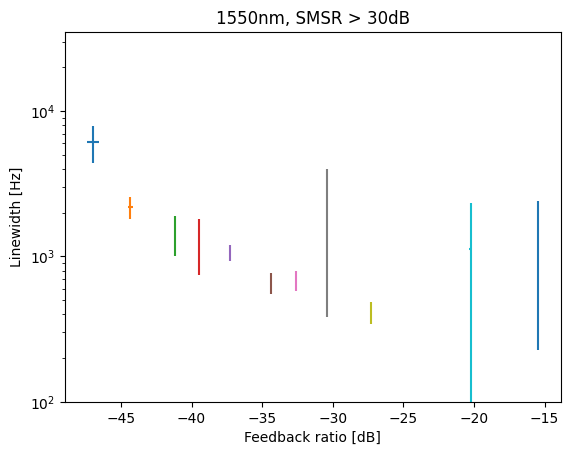

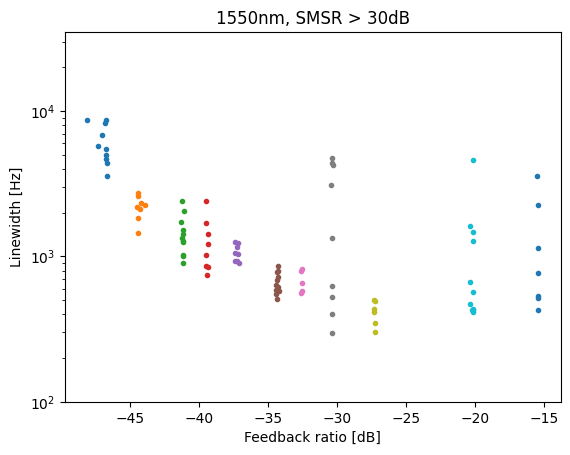

In [ ]:
filtered_linewidths_1550nm = [[None for _ in range(len(linewidths_1550nm[data_index]))] for data_index in range(datasets_no_1550nm)]
# indices = [[] for _ in range(datasets_no)]

smsr_cutoff = 30

for data_index in range(datasets_no_1550nm):
    for i in range(0,len(smsrs_1550nm[data_index])): #Assuming that all the linewidth measurement were taken with the zoom spectrum first and then the full spectrum..
            if (smsrs_1550nm[data_index][i] is not None): # and smsrs[data_index][i+1] is not None):
                if (smsrs_1550nm[data_index][i] > smsr_cutoff): # and smsrs[data_index][i+1] > 35):
                    filtered_linewidths_1550nm[data_index][i] = linewidths_1550nm[data_index][i]
                    # indices[data_index].append(i)


for data_index in range(datasets_no_1550nm):

    if sum(np.array(filtered_linewidths_1550nm[data_index])!=None) > 3: #Outlier sorting doesn't work for n<=3, so only take datasets with 4 datapoints or more.
        _,smsr_filter = outlier_sorting(filtered_linewidths_1550nm[data_index])

        plt.figure(1)
        plt.plot(np.array(feedback_ratios_1550nm[data_index])[smsr_filter],np.array(filtered_linewidths_1550nm[data_index])[smsr_filter],'.')
        plt.figure(2)
        plt.errorbar(np.average(np.array(feedback_ratios_1550nm[data_index])[smsr_filter]),np.average(np.array(filtered_linewidths_1550nm[data_index])[smsr_filter]),yerr=np.std(np.array(filtered_linewidths_1550nm[data_index])[smsr_filter]),xerr=np.std(np.array(feedback_ratios_1550nm[data_index])[smsr_filter]))
plt.yscale('log')
plt.xlabel('Feedback ratio [dB]')
plt.ylabel('Linewidth [Hz]')
plt.title(f'1550nm, SMSR > {smsr_cutoff}dB')
plt.ylim([1e2,35e3])

plt.savefig(fr'C:\Users\au617810\OneDrive - Aarhus universitet\Videnskabelig assistent\Measurement spectra and plots\Linewidts_FB_IQR\1550nm_SMSR_errorbars.pdf')

plt.figure(1)
plt.title(f'1550nm, SMSR > {smsr_cutoff}dB')
plt.yscale('log')
plt.xlabel('Feedback ratio [dB]')
plt.ylabel('Linewidth [Hz]')
plt.ylim([1e2,35e3])

plt.savefig(fr'C:\Users\au617810\OneDrive - Aarhus universitet\Videnskabelig assistent\Measurement spectra and plots\Linewidts_FB_IQR\1550nm_SMSR_data.pdf')


FB level is -47.07595175296851 +/- 0.5357207392321645, linewidth is 6647.188326027288 +/- 1948.0540099609032
FB level is -44.43147023157938 +/- 0.06930269492341384, linewidth is 2045.8616941795717 +/- 384.21634779673053
FB level is -41.183527205178244 +/- 0.031301753451675636, linewidth is 1218.354529228554 +/- 206.13298270347718
FB level is -39.49368061815024 +/- 0.0524021401230769, linewidth is 1078.0571642812533 +/- 370.712137856395
FB level is -37.24453068010687 +/- 0.08868448930438859, linewidth is 1051.9633569623584 +/- 127.9809288829209
FB level is -34.361737110662915 +/- 0.05989731689693891, linewidth is 654.7067476190434 +/- 96.16992835646752
FB level is -20.18602614648467 +/- 0.01215912754372801, linewidth is 637.8241968400896 +/- 363.57592614276626


(100.0, 35000.0)

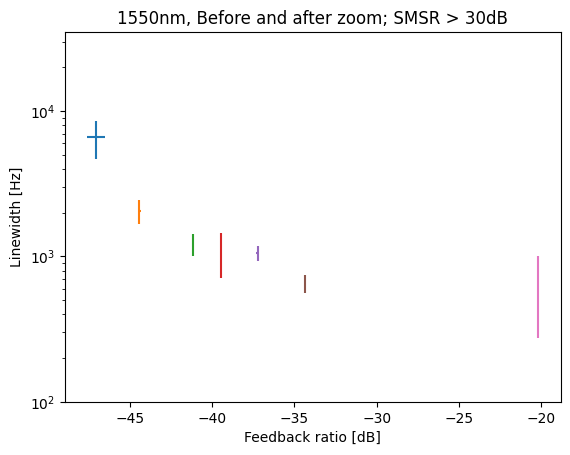

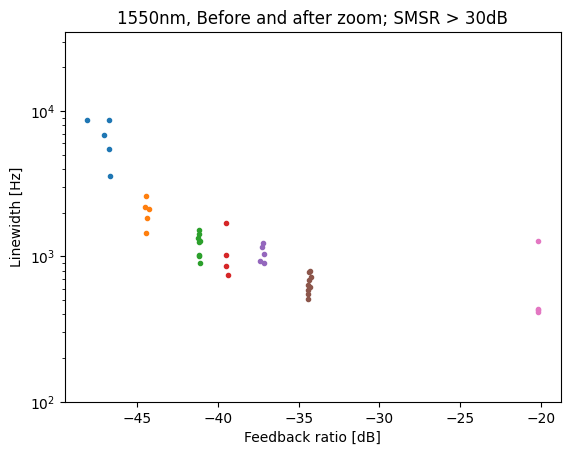

In [ ]:
double_filtered_linewidths_1550nm = [[None for _ in range(len(linewidths_1550nm[data_index]))] for data_index in range(datasets_no_1550nm)]
# indices = [[] for _ in range(datasets_no)]

smsr_cutoff = 30

for data_index in range(datasets_no_1550nm):
    for i in range(0,len(smsrs_1550nm[data_index])): #Assuming that all the linewidth measurement were taken with the zoom spectrum first and then the full spectrum.(they most likely are, as a readme from 16th of May has the reverse order when mentioning counts)

            if i%10 == 0:
                pass
                # if smsrs[data_index][i] is not None:
                #     if smsrs[data_index][i] > smsr_cutoff+7:
                #         double_filtered_linewidths[data_index][i] = linewidths[data_index][i]
            
            elif (smsrs_1550nm[data_index][i-1] is not None and smsrs_1550nm[data_index][i] is not None):
                if (smsrs_1550nm[data_index][i-1] > smsr_cutoff and smsrs_1550nm[data_index][i] > smsr_cutoff):
                    double_filtered_linewidths_1550nm[data_index][i] = linewidths_1550nm[data_index][i]
                    # indices[data_index].append(i)


for data_index in range(datasets_no_1550nm):

    if sum(np.array(double_filtered_linewidths_1550nm[data_index])!=None) > 3: #Outlier sorting doesn't work for n<=3, so only take datasets with 4 datapoints or more.
        _,smsr_filter = outlier_sorting(double_filtered_linewidths_1550nm[data_index])

        plt.figure(1)
        plt.plot(np.array(feedback_ratios_1550nm[data_index])[smsr_filter],np.array(double_filtered_linewidths_1550nm[data_index])[smsr_filter],'.')
        plt.figure(2)
        plt.errorbar(np.average(np.array(feedback_ratios_1550nm[data_index])[smsr_filter]),np.average(np.array(double_filtered_linewidths_1550nm[data_index])[smsr_filter]),yerr=np.std(np.array(double_filtered_linewidths_1550nm[data_index])[smsr_filter]),xerr=np.std(np.array(feedback_ratios_1550nm[data_index])[smsr_filter]))
        print(f'FB level is {np.average(np.array(feedback_ratios_1550nm[data_index])[smsr_filter])} +/- {np.std(np.array(feedback_ratios_1550nm[data_index])[smsr_filter])}, linewidth is {np.average(np.array(double_filtered_linewidths_1550nm[data_index])[smsr_filter])} +/- {np.std(np.array(double_filtered_linewidths_1550nm[data_index])[smsr_filter])}')

plt.yscale('log')
plt.xlabel('Feedback ratio [dB]')
plt.ylabel('Linewidth [Hz]')
plt.title(f'1550nm, Before and after zoom; SMSR > {smsr_cutoff}dB')
plt.ylim([1e2,35e3])
#plt.savefig(fr'C:\Users\au617810\OneDrive - Aarhus universitet\Videnskabelig assistent\Measurement spectra and plots\Linewidts_FB_IQR\1550nm_double_SMSR_errorbars.pdf')


plt.figure(1)
plt.title(f'1550nm, Before and after zoom; SMSR > {smsr_cutoff}dB')
plt.yscale('log')
plt.xlabel('Feedback ratio [dB]')
plt.ylabel('Linewidth [Hz]')
plt.ylim([1e2,35e3])
#plt.savefig(fr'C:\Users\au617810\OneDrive - Aarhus universitet\Videnskabelig assistent\Measurement spectra and plots\Linewidts_FB_IQR\1550nm_double_SMSR_datapoints.pdf')


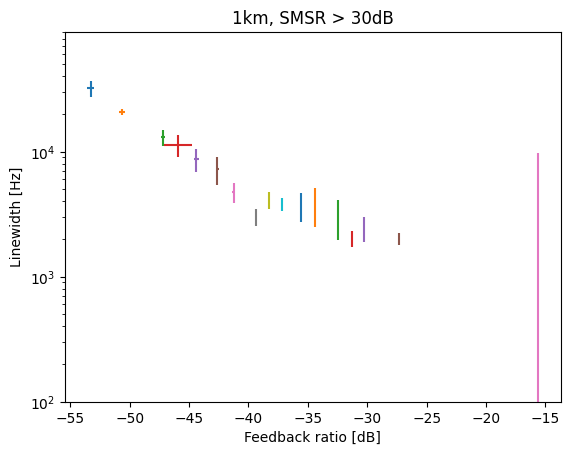

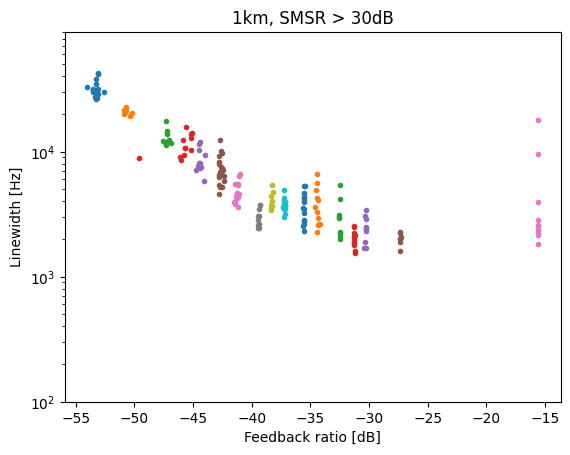

In [ ]:
filtered_linewidths_1km = [[None for _ in range(len(linewidths_1km[data_index]))] for data_index in range(datasets_no_1km)]
# indices = [[] for _ in range(datasets_no)]

smsr_cutoff = 30

for data_index in range(datasets_no_1km):
    for i in range(0,len(smsrs_1km[data_index])): #Assuming that all the linewidth measurement were taken with the zoom spectrum first and then the full spectrum..
            if (smsrs_1km[data_index][i] is not None): # and smsrs[data_index][i+1] is not None):
                if (smsrs_1km[data_index][i] > smsr_cutoff): # and smsrs[data_index][i+1] > 35):
                    filtered_linewidths_1km[data_index][i] = linewidths_1km[data_index][i]
                    # indices[data_index].append(i)


for data_index in range(datasets_no_1km):

    if sum(np.array(filtered_linewidths_1km[data_index])!=None) > 3: #Outlier sorting doesn't work for n<=3, so only take datasets with 4 datapoints or more.
        _,smsr_filter = outlier_sorting(filtered_linewidths_1km[data_index])


        plt.figure(1)
        plt.plot(np.array(feedback_ratios_1km[data_index])[smsr_filter],np.array(filtered_linewidths_1km[data_index])[smsr_filter],'.')
        plt.figure(2)
        plt.errorbar(np.average(np.array(feedback_ratios_1km[data_index])[smsr_filter]),np.average(np.array(filtered_linewidths_1km[data_index])[smsr_filter]),yerr=np.std(np.array(filtered_linewidths_1km[data_index])[smsr_filter]),xerr=np.std(np.array(feedback_ratios_1km[data_index])[smsr_filter]))
plt.yscale('log')
plt.xlabel('Feedback ratio [dB]')
plt.ylabel('Linewidth [Hz]')
plt.title(f'1km, SMSR > {smsr_cutoff}dB')
plt.ylim([1e2,9e4])
plt.savefig(fr'C:\Users\au617810\OneDrive - Aarhus universitet\Videnskabelig assistent\Measurement spectra and plots\Linewidts_FB_IQR\1km_SMSR_errorbars.pdf')



plt.figure(1)
plt.title(f'1km, SMSR > {smsr_cutoff}dB')
plt.yscale('log')
plt.xlabel('Feedback ratio [dB]')
plt.ylabel('Linewidth [Hz]')
plt.ylim([1e2,9e4])
plt.savefig(fr'C:\Users\au617810\OneDrive - Aarhus universitet\Videnskabelig assistent\Measurement spectra and plots\Linewidts_FB_IQR\1km_SMSR_datapoints.pdf')


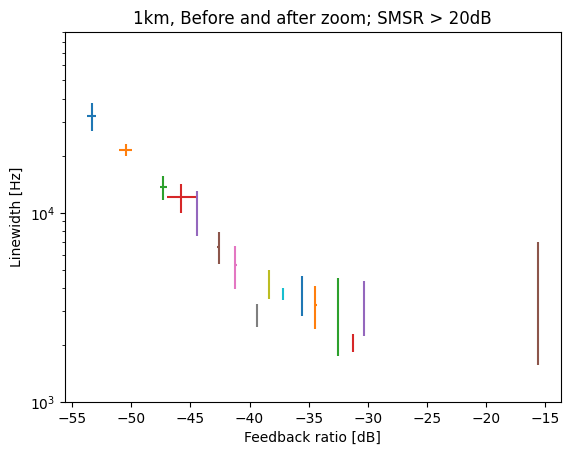

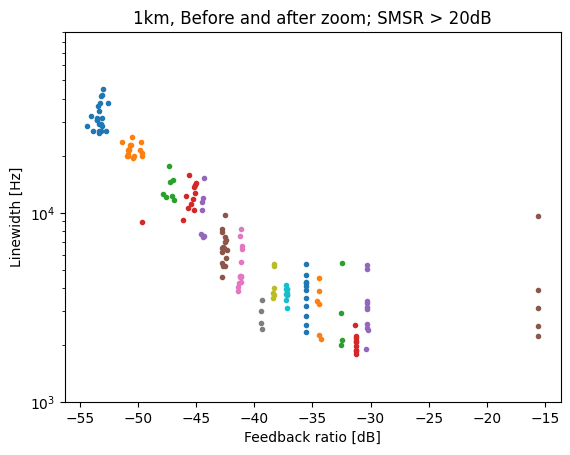

In [ ]:
double_filtered_linewidths_1km = [[None for _ in range(len(linewidths_1km[data_index]))] for data_index in range(datasets_no_1km)]
# indices = [[] for _ in range(datasets_no)]

smsr_cutoff = 20

for data_index in range(datasets_no_1km):
    for i in range(0,len(smsrs_1km[data_index])): #Assuming that all the linewidth measurement were taken with the zoom spectrum first and then the full spectrum.(they most likely are, as a readme from 16th of May has the reverse order when mentioning counts)

            if i%10 == 0:
                pass
                # if smsrs[data_index][i] is not None:
                #     if smsrs[data_index][i] > smsr_cutoff+7:
                #         double_filtered_linewidths[data_index][i] = linewidths[data_index][i]
            
            elif (smsrs_1km[data_index][i-1] is not None and smsrs_1km[data_index][i] is not None):
                if (smsrs_1km[data_index][i-1] > smsr_cutoff and smsrs_1km[data_index][i] > smsr_cutoff):
                    double_filtered_linewidths_1km[data_index][i] = linewidths_1km[data_index][i]
                    # indices[data_index].append(i)


for data_index in range(datasets_no_1km):

    if sum(np.array(double_filtered_linewidths_1km[data_index])!=None) > 3: #Outlier sorting doesn't work for n<=3, so only take datasets with 4 datapoints or more.
        _,smsr_filter = outlier_sorting(double_filtered_linewidths_1km[data_index])



        plt.figure(1)
        plt.plot(np.array(feedback_ratios_1km[data_index])[smsr_filter],np.array(double_filtered_linewidths_1km[data_index])[smsr_filter],'.')
        plt.figure(2)
        plt.errorbar(np.average(np.array(feedback_ratios_1km[data_index])[smsr_filter]),np.average(np.array(double_filtered_linewidths_1km[data_index])[smsr_filter]),yerr=np.std(np.array(double_filtered_linewidths_1km[data_index])[smsr_filter]),xerr=np.std(np.array(feedback_ratios_1km[data_index])[smsr_filter]))
plt.yscale('log')
plt.xlabel('Feedback ratio [dB]')
plt.ylabel('Linewidth [Hz]')
plt.title(f'1km, Before and after zoom; SMSR > {smsr_cutoff}dB')
plt.ylim([1e3,9e4])
plt.savefig(fr'C:\Users\au617810\OneDrive - Aarhus universitet\Videnskabelig assistent\Measurement spectra and plots\Linewidts_FB_IQR\1km_double_SMSR_errorbars.pdf')


plt.figure(1)
plt.title(f'1km, Before and after zoom; SMSR > {smsr_cutoff}dB')
plt.yscale('log')
plt.xlabel('Feedback ratio [dB]')
plt.ylabel('Linewidth [Hz]')
plt.ylim([1e3,9e4])
plt.savefig(fr'C:\Users\au617810\OneDrive - Aarhus universitet\Videnskabelig assistent\Measurement spectra and plots\Linewidts_FB_IQR\1km_double_SMSR_datapoints.pdf')


In [ ]:
linewidths

[[28572.242010360635,
  22363.041719278135,
  16788.268510570648,
  26482.58783878488,
  27301.017377726213,
  25961.97227466325,
  27243.554772738207,
  27653.860446817143,
  21133.35287917188,
  20366.601660118973,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None],
 [None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  11212.313758922777,
  12028.642676854799,
  6841.185530530667,
  7123.630169018367,
  8767.784915268545,
  10789.68488923212,
  8515.446375378844,
  6279.905326828522,
  9550.630252961291,
  10355.859514242313],
 [979.9820960646117,
  1504.4179667335145,
  3390.8585284630813,
  3782.285619266753,
  6421.50971324281,
  2307.3922468099017,
  913.8171137337557,
  5260.194309224269,
  4666.243595629516,
  9832.550997685094,
  1202.2361831148382,
  3260.3188912047412,
  1626.356676085177,
  6390.813930066319,
  1410.2444159106526,
  1159.662798325541,
  1066.904356163104,
  4559.158304041406,
  1296.996279416994,
  73

Text(0, 0.5, 'Linewidth [Hz]')

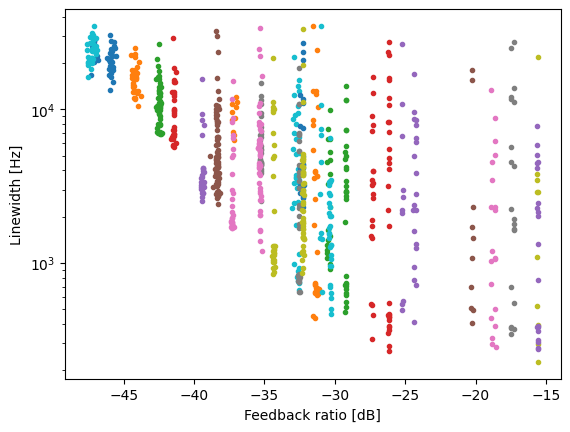

In [ ]:
plt.figure(1)
for i in range(len(smsrs)):
    plt.plot(feedback_ratios[i],np.array(linewidths[i]),'.')
plt.yscale('log')
plt.xlabel('Feedback ratio [dB]')
plt.ylabel('Linewidth [Hz]')

Text(0, 0.5, 'Linewidth [Hz]')

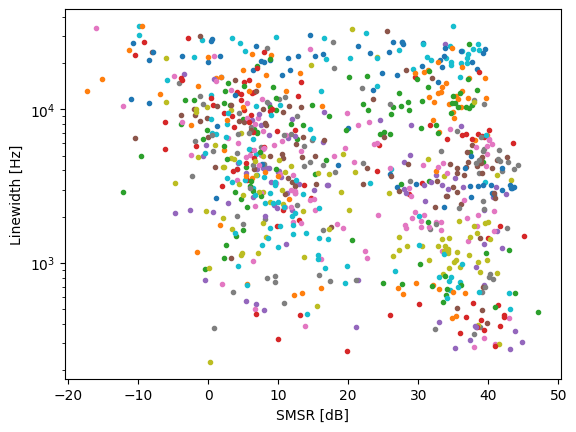

In [ ]:
plt.figure(1)
for i in range(len(smsrs)):
    plt.plot(smsrs[i],np.array(linewidths[i]),'.')
plt.yscale('log')
plt.xlabel('SMSR [dB]')
plt.ylabel('Linewidth [Hz]')

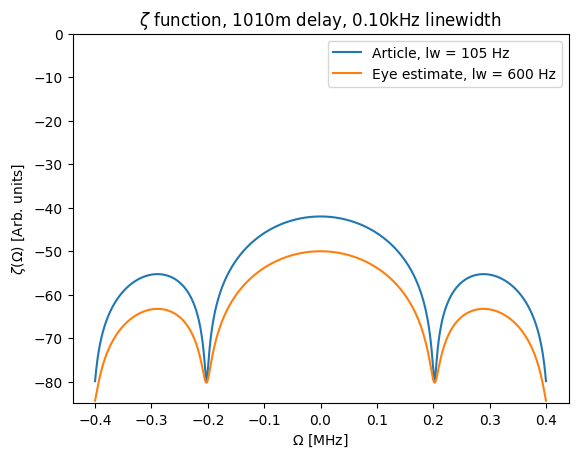

In [57]:
linewidth = 105
delay = 1010
spectrum_range = 0.4e6
freq = np.linspace(-spectrum_range,spectrum_range,10**3)
offset = 30


plt.plot(freq*10**(-6), ff.zeta_fit(freq,linewidth,offset,delay)-max(ff.zeta_fit(freq,linewidth,offset,delay))-42, label=f"Article, lw = {linewidth} Hz")

plt.plot(freq*10**(-6), ff.zeta_fit(freq,600,offset,delay)-max(ff.zeta_fit(freq,600,offset,delay))-50, label="Eye estimate, lw = 600 Hz")
plt.legend()


plt.title(rf'$\zeta$ function, {delay:.0f}m delay, {linewidth*1e-3:.2f}kHz linewidth')
plt.xlabel(r'$\Omega$ [MHz]')
plt.ylabel(r'$\zeta(\Omega)$ [Arb. units]')
#plt.axvline(x = -11.7, color = 'b', linestyle='--',  label = 'axvline - full height')
#plt.axvline(x = 11.7*6-76, color = 'b', linestyle='--',  label = 'axvline - full height')


#plt.plot(xs,np.exp(fitfunc(xs,params_lin[0]))
plt.ylim([-85,0])

#plt.legend(loc='lower left')
#plt.xlim([-71,-15])


#plt.savefig(fr'./Measurement spectra and plots/Simulations/Zeta_func_{linewidth*1e-3:.0f}MHz_linewidth_{delay*1e-3:.0f}m_delay.png')
#plt.savefig(fr'./Measurement spectra and plots/Simulations/Zeta_func_{linewidth*1e-3:.0f}MHz_linewidth_{delay*1e-3:.0f}m_delay.pdf')

#plt.savefig(fr'../../Measurement spectra and plots/Simulations/Prokoshin_article_eye_test.pdf')

In [48]:
os.getcwd()

'c:\\Users\\au617810\\OneDrive - Aarhus universitet\\Videnskabelig assistent\\PICLab_narrow_linewidth\\feedback_u_shaped_laser'

In [ ]:
print(f'The largest difference in feedback ratio calculation is {max(abs(10*np.log10(np.divide(np.array(feedback_powers),np.array(laser_powers)*40))-np.array(feedback_ratios))):.2f} dB')

ValueError: max() iterable argument is empty

In [ ]:
freq = np.linspace(-10**6,10**6,10**7)


plt.plot(freq, ff.zeta_fit(freq,1*10**4,0,500))

In [ ]:
def get_smsr(spectrum, center, fsr, plot = False):
    sideband1 = center - fsr
    sideband2 = center + fsr
    ps = spectrum.powers
    fs = spectrum.freqs

    filter1 = abs(fs - sideband1) < 1
    ps1 = ps[filter1]
    fs1 = fs[filter1]

    filter2 = abs(fs - sideband2) < 1
    ps2 = ps[filter2]
    fs2 = fs[filter2]

    filter3 = abs(fs - center) < 1
    ps3 = ps[filter3]
    fs3 = fs[filter3]

    if plot:
        data.plot()

    return max(ps3) - max([max(ps1),max(ps2)])


data = dirs[3][0][5]

measurement = dirs[6][0]

for spectrum in measurement:
    if spectrum != None:
        print(get_smsr(spectrum,80, 12.5))

20.880562782287598
33.453453063964844
40.96904277801514
4.048601150512695
39.40271186828613
3.2175369262695312
6.402019500732422
42.96975088119507
11.788795471191406
1.9955177307128906
22.630831718444824
16.153505325317383
15.266050338745117
6.641422271728516
7.134934425354004
7.537044525146484
10.587982177734375
13.794027328491211
37.96106195449829
10.968986511230469
